# CSCI E-82  Homework 2   
### v1.0 9/15/17 11:45pm
Due by Saturday 9/30/17 at 11:59pm EST to the Canvas dropbox

### Be sure that the code can run from start to finish without errors.
### Save the notebook as HW2_yourLastName_partnerLasttName.
### This is a partner homework so work with one partner.  Both partners should submit the same homework to Cavnas.

-----------

## Introduction

The goals of this homework are:
- to try out a number of clustering techniques
- to compare feature-based and raw time series data
- to see whether Morningstar categories are evident from the data
- to try out dynamic time warping
- to gain experience in time series modeling





## Problem 0
The file mutualFunds.csv contains a list of mutual fund symbols and their respective classes.  Extract the data for September 1, 2012 – September 1, 2017.  The python package https://pypi.python.org/pypi/fix-yahoo-finance/0.0.19 may be useful for this purpose, but any method is fair game.  We found that the Google equivalent works great for stocks but doesn't work for mutual funds.  We also found that Yahoo messed up its service in May 2017 so half the packages out there no longer work.  

Since these are mutual funds, there are no intra-day prices so you can use the closing prices.  Note that Yahoo's service is not perfect in that it may return $0.00 or null or NA values for some days.  In such cases, interpolate the results by using the average of the surrounding values as you see fit.

For this problem, you may need the following:
pip install pandas-datareader
pip install yahoo-finance
pip install fix_yahoo_finance --upgrade --no-cache-dir


Print out the first two weeks of OAKMX

In [1]:
# This might be a good place to include all your import files
%matplotlib inline

# special IPython command to prepare the notebook for matplotlib
%matplotlib inline 

import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt

from datetime import datetime
import requests
import seaborn as sns
import pandas_datareader.data as web

import statsmodels.api as sm
import statsmodels.tsa.api as smt
import statsmodels.graphics.api as smg
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.stattools import adfuller, periodogram
from statsmodels.graphics.gofplots import qqplot
from statsmodels.tsa.statespace.sarimax import SARIMAX

import sklearn
from sklearn.utils import shuffle
from sklearn.cluster import KMeans
from sklearn import datasets
from sklearn import metrics
from pandas.plotting import scatter_matrix, parallel_coordinates, andrews_curves

from IPython import display
from IPython.core.display import Image

#from dtw import dtw

# special matplotlib command for global plot configuration
from matplotlib import rcParams
import matplotlib.cm as cm
import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
from ggplot import *

sns.set(style='ticks', context='talk')

/anaconda/lib/python3.6/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools
/anaconda/lib/python3.6/site-packages/ggplot/utils.py:81: FutureWarning: pandas.tslib is deprecated and will be removed in a future version.
You can access Timestamp as pandas.Timestamp
  pd.tslib.Timestamp,
/anaconda/lib/python3.6/site-packages/ggplot/stats/smoothers.py:4: FutureWarning: The pandas.lib module is deprecated and will be removed in a future version. These are private functions and can be accessed from pandas._libs.lib instead
  from pandas.lib import Timestamp


We query the data from Yahoo Finance and impute the missing data by padding to the last known value.

In [2]:
def get_data(file, start, end):
    
    funds = pd.read_csv(file, header=None)
    
    f = web.DataReader(funds.loc[:, 0], 'yahoo', start, end) \
        .loc['Close'] \
        .sort_index()
    
    return f

fund_data = get_data("mutualFunds.csv", start=datetime(2012, 9, 1), end=datetime(2017, 9, 1)) \
    .fillna(method='pad', axis=1) \
    .transpose()

Next, we show the first two weeks of data for 'OAKMX'.

In [3]:
fund_data.loc['OAKMX'].sort_index().head(n=10)

Date
2012-08-31    47.980000
2012-09-04    47.939999
2012-09-05    47.889999
2012-09-06    48.950001
2012-09-07    49.180000
2012-09-10    48.790001
2012-09-11    48.959999
2012-09-12    49.130001
2012-09-13    49.919998
2012-09-14    50.310001
Name: OAKMX, dtype: float64

In [4]:
# Check that we have no zeros in the data
assert (fund_data == 0).sum().sum() == 0
assert (fund_data.isnull()).sum().sum() == 0

We calculate the return data:

In [5]:
return_data = fund_data \
     .apply(np.log, axis=1) \
     .diff(axis=1) \
     .dropna(axis=1)
 
def to_tidy(X):
    return(X.reset_index().melt(id_vars=['index']))

bad_data = to_tidy(return_data).loc[lambda x: np.abs(x.value) > 0.5].Date.value_counts()
bad_data

2016-06-30    124
2016-06-29    121
2016-05-19     11
2016-05-20     11
2013-05-20      3
2013-05-21      3
2015-12-18      1
Name: Date, dtype: int64

The two dates "2016-06-29" and "2016-06-30", are outliers. It is very likely that we are seeing high volatility caused by the market reacting to the Brexit vote where 2 trillion dollars was wiped off the global market(https://www.theguardian.com/business/live/2016/jun/24/global-markets-ftse-pound-uk-leave-eu-brexit-live-updates). Here we will first examine the data and its likely effect on our clustering.

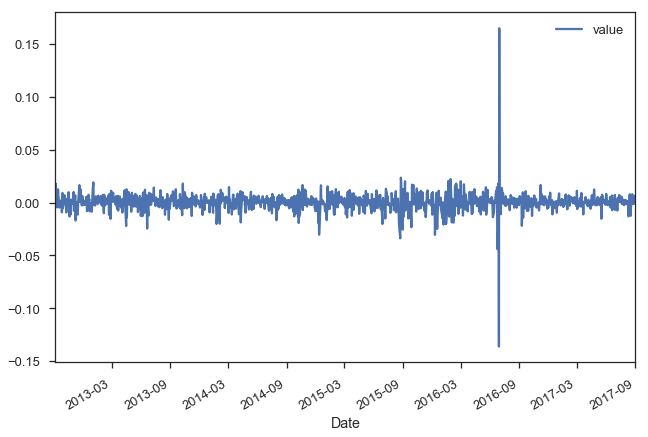

In [6]:
# Randomly select 100 funds
rd_sample = return_data.sample(100,random_state=1234).melt()

rd_mu = rd_sample.groupby("Date").mean()
rd_mu.plot()


For the puspose of visualising this, we took a random sample of 100 funds and plotted the means. As we can see, there is considerable volatility compared to normal.

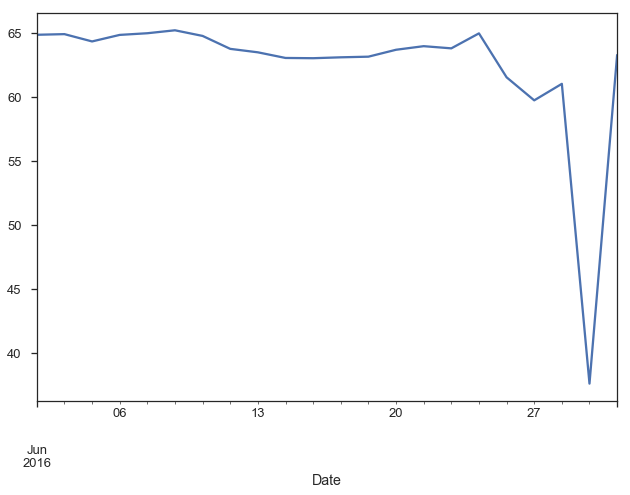

In [7]:
fund_data.loc['OAKMX'].loc['2016-06'].plot()

In [8]:
fund_data = fund_data.drop(pd.to_datetime(['2016-06-29', '2016-06-30', '2016-05-19', '2016-05-20', '2013-05-21', '2013-05-20 ', '2015-12-18', '2015-12-21']), axis=1)

These two dates would be very dominant in a distance based clustering approach. We thus decided to drop these two values and all other with very big returns (those are only a few values, after all).

In [9]:
total_return_data = fund_data.apply(lambda x: x / x[0], axis=1)

return_data = fund_data \
     .apply(np.log, axis=1) \
     .diff(axis=1) \
     .dropna(axis=1)

to_tidy(return_data).loc[lambda x: np.abs(x.value) > 0.5].Date.value_counts()

2015-12-22    1
Name: Date, dtype: int64

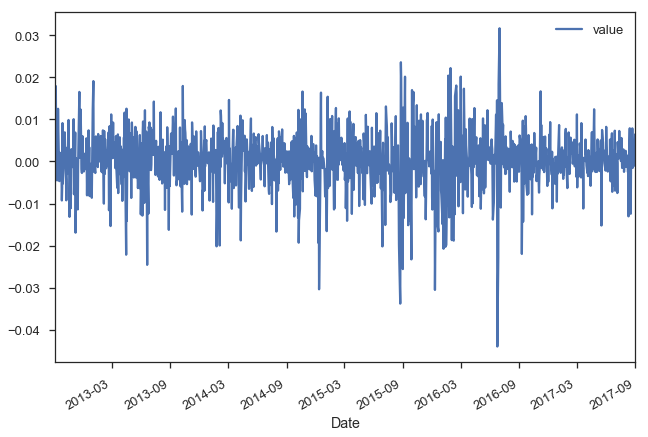

In [10]:
rd_sample = return_data.sample(100,random_state=1234).melt()

rd_mu = rd_sample.groupby("Date").mean()
rd_mu.plot()


Now, we have way fewer extreme values. As we can see above, the overall variance has been reduced and should give us more meaningful clusters.

## Problem 1  Cluster the raw data (25 pts)


### Problem 1a

One can assume that all the data start and end at the same time point so no time warping will be required to compare different schemes. However, that does not mean that you should not explore different normalization approaches that may be applicable.  Apply several clustering schemes to identify an appropriate clustering method for the data.  You will likely have to tune the clustering parameters.  We are looking for:
<ul>
<li> effort & learnings from trying different methods/approaches, particularly some not covered in previous classes
<li> logical approach to the clustering problem using insights gained and stated
<li> tuning of the algorithm to the appropriate number of clusters, parameters, etc.
</ul>


We came up with two normalization schemes:

+ Daily return: calculate the difference of the logs of each stock. This normalization scheme weights every day equally and asks the question which stocks move together. Further normalization is not necessary since all data are on the same scale (normalzing every day to have standard deviation one would be like normalizing every pixel to have standard deviation one in image classification; possible, but not necessary).
+ Total returns since 2012-09-01: this is different in that the final days count much more than the inital days since the long term differences have become much more pronounced (thinking of each stock as a random walk with drift, the variance is proportional to the time evolved. Thus the farther in the future, the bigger the expected differences between stocks).

Note that both normalization schemes could make sense, but they answer different questions.

To begin with, let us plot a couple of stocks for both normalization schemes:

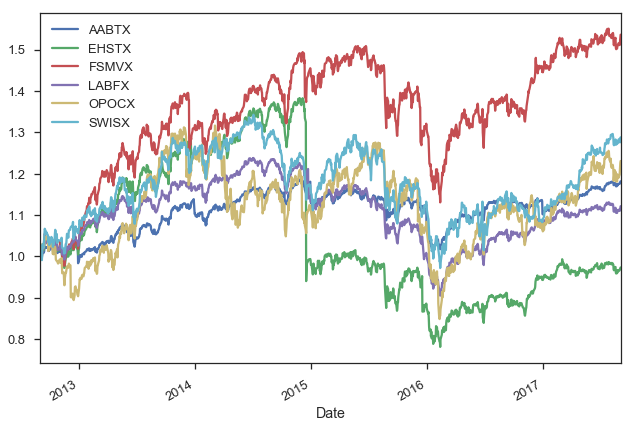

In [11]:
total_return_data.iloc[[0, 100, 200, 300, 400, 500], :].transpose().plot()

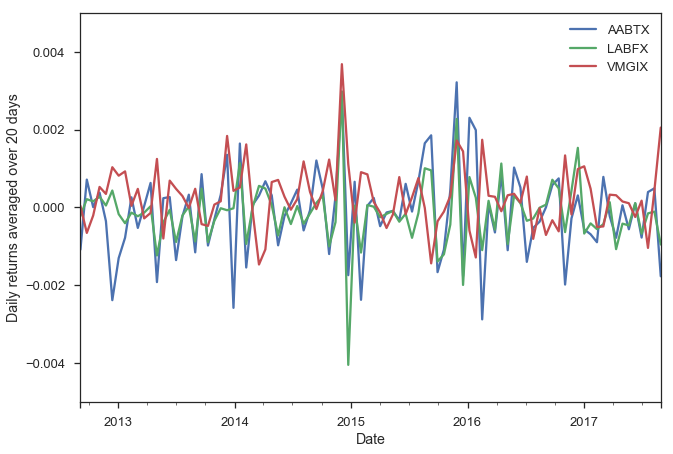

In [12]:
return_data_centered = return_data - return_data.mean(axis=0)

return_data_centered.iloc[[0, 300, 600], :].resample('20d', axis=1).mean().transpose().plot(ylim=(-0.005, 0.005))
plt.ylabel('Daily returns averaged over 20 days')

The second plot hints that there might be some clustering strucutre: the green and blue stocks seem to be quite correlated to each other (most of the time), while the red one seems to be very different.

Just visually, it seems much easier to cluster the total return data. Let us wrangle the data a bit and create a "tidy" fund data frame for later reference.

In [13]:
fund_data_names = pd.read_csv("mutualFunds.csv", header=None, names=['index', 'type'])

fund_data_tidy = fund_data \
     .apply(lambda x: x / x[0], axis=1) \
     .resample('30d', axis=1) \
     .reset_index(inplace=False) \
     .melt(id_vars=['index'])

/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: 
.resample() is now a deferred operation
You called reset_index(...) on this deferred object which materialized it into a dataframe
by implicitly taking the mean.  Use .resample(...).mean() instead
  This is separate from the ipykernel package so we can avoid doing imports until


Let us calculate the [Hopkins statistic](http://www.sthda.com/english/articles/29-cluster-validation-essentials/95-assessing-clustering-tendency-essentials/#methods-for-assessing-clustering-tendency) to assess whether there is some clustered structure in the data. We have to do the calculation on the daily return data: on total return, one cannot simply use random numbers generated uniformly at random within the range of total returns on a given day. The point is that stocks have significant autocorrelation (they are probably $I(1)$). The Hopkins statistic indicates that the daily return data do exhibit some clustering tendency (or that the null hypothesis that the daily returns are distributed uniformly at random can be rejected).

In [14]:
X = return_data
d = X.shape[1] # columns
n = X.shape[0] # rows
m = int(0.1 * n) # heuristic from article [1]

from sklearn.neighbors import NearestNeighbors
from random import sample
rand_X = X.iloc[sample(range(0, n, 1), m), :]
nbrs = NearestNeighbors(n_neighbors=1, algorithm='brute').fit(rand_X)


col_max = X.max(axis=0).values
col_min = X.min(axis=0).values
ranges = np.array([col_max, col_min])

ujd = []
wjd = []
for j in range(0, m):
    q = ((np.random.uniform(size=(1, d)).reshape(1, -1) * (ranges[0, :] - ranges[1, :]) + ranges[1, :])) 
    u_dist, _ = nbrs.kneighbors(q, return_distance=True)
    ujd.append(u_dist[0][0])
    w_dist, _ = nbrs.kneighbors(rand_X.iloc[j, :].values.reshape(1, -1), return_distance=True)
    wjd.append(w_dist[0][0])

H = sum(wjd) / (sum(ujd) + sum(wjd))
print(H)

7.08886856717e-10


As the Hopkins Score is less than the threshold 0.5, we reject the null hypothesis and conclude that our data is significantly clusterable.

Let us calculate the pairwise distances and plot a heatmap for the total return data: from that plot it can be argued that 3, 4 or 5 clusters are visible: the distances near the diagonal are smaller than the off-diagonal distances.

/anaconda/lib/python3.6/site-packages/matplotlib/cbook.py:136: MatplotlibDeprecationWarning: The axisbg attribute was deprecated in version 2.0. Use facecolor instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


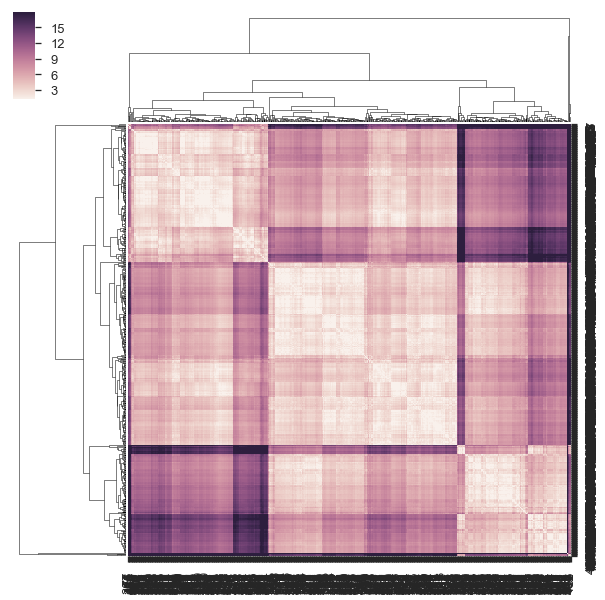

In [15]:
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage

diss = squareform(pdist(total_return_data))
sns.clustermap(data=diss, method="average", robust=True)

For the daily return data, the structure is much less clear. One could argue that there is some clustering structure: for example, in the lower right corner, the funds have much bigger difference to the other ones. Visually, one can still plot "clusters" along the diagonal, but the structure does not seem to be very pronounced.

/anaconda/lib/python3.6/site-packages/matplotlib/cbook.py:136: MatplotlibDeprecationWarning: The axisbg attribute was deprecated in version 2.0. Use facecolor instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


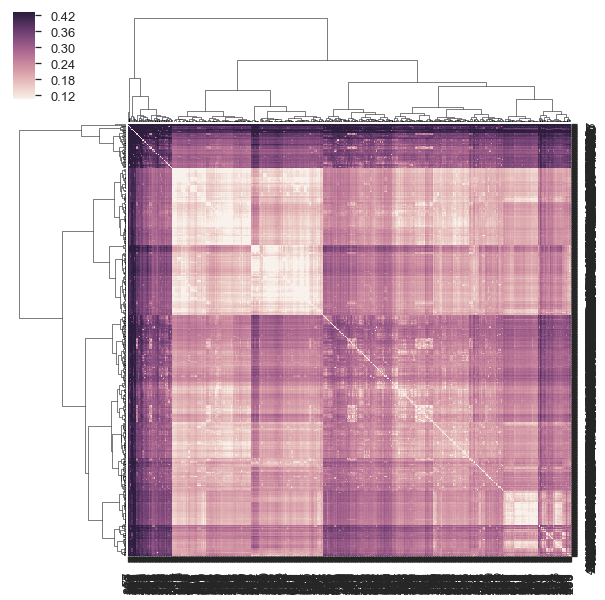

In [16]:
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage

diss = squareform(pdist(return_data))
sns.clustermap(data=diss, method="ward", robust=True)

Next, we define a helper function to make silhouette plots (similar to the one from Section 3):

In [17]:
from sklearn.metrics import silhouette_samples
from sklearn.metrics import silhouette_score

def make_one_silhouette(X_in, clusterer, title=None):
    if hasattr(clusterer, 'labels_'):
        cluster_labels = clusterer.fit_predict(X_in)
    else:
        alg = clusterer.fit(X_in)
        cluster_labels = clusterer.predict(X_in)
    n_clusters = len(np.unique(cluster_labels))
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X_in) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X_in, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X_in, cluster_labels)

    y_lower = 10

    # Draw actual clusters
    colors = cm.spectral(cluster_labels.astype(float) / n_clusters)

    funds = X_in.reset_index().loc[:, ['index']]
    funds['cluster'] = cluster_labels

    X_by_cluster = to_tidy(X_in) \
        .merge(funds) \
        .groupby(['cluster', 'Date'], as_index=False) \
        .aggregate('mean') 

    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

        X_cluster = X_by_cluster.loc[lambda x: x.cluster == i]
        ax2.plot(X_cluster['Date'], X_cluster['value'], c=color)


    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhoutte score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    #ax1.yaxis.set_ticks_position('none')
    #ax1.xaxis.set_ticks_position('none')
    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.xaxis.grid(True)
    ax1.set_xticks([-0.2, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # Draw white circles at cluster centers
    #centers = clusterer.cluster_centers_
    plt.suptitle(title)

    #remove_border()
    plt.show()   
    


After this initial exploratory analysis, we decided to start the clustering process and try and evaluate several algorithms on the *total return data*. We start with the most standard algorithm, KMeans:

For n_clusters = 2 The average silhouette_score is : 0.462964300426


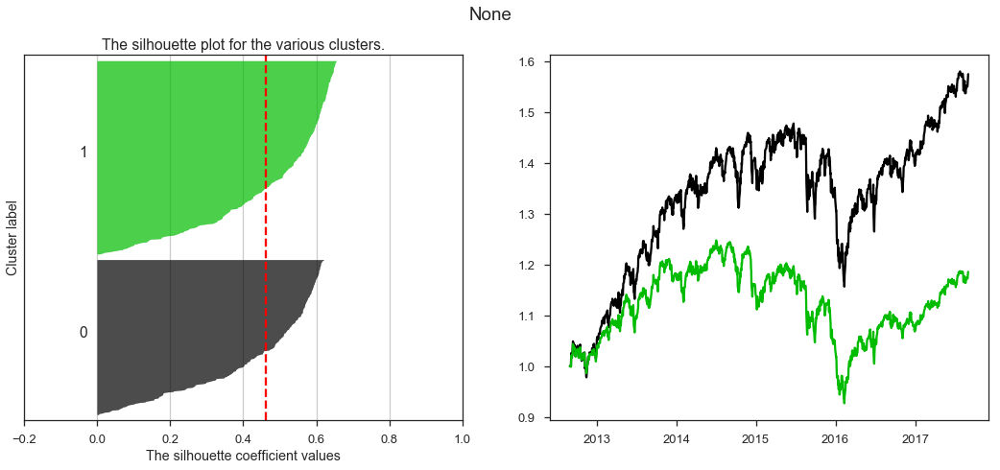

For n_clusters = 3 The average silhouette_score is : 0.401159640522


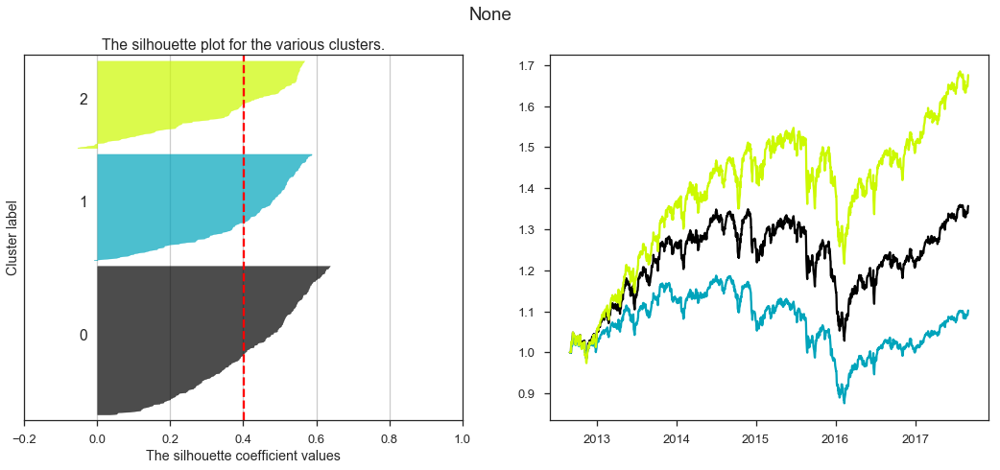

For n_clusters = 4 The average silhouette_score is : 0.348986003744


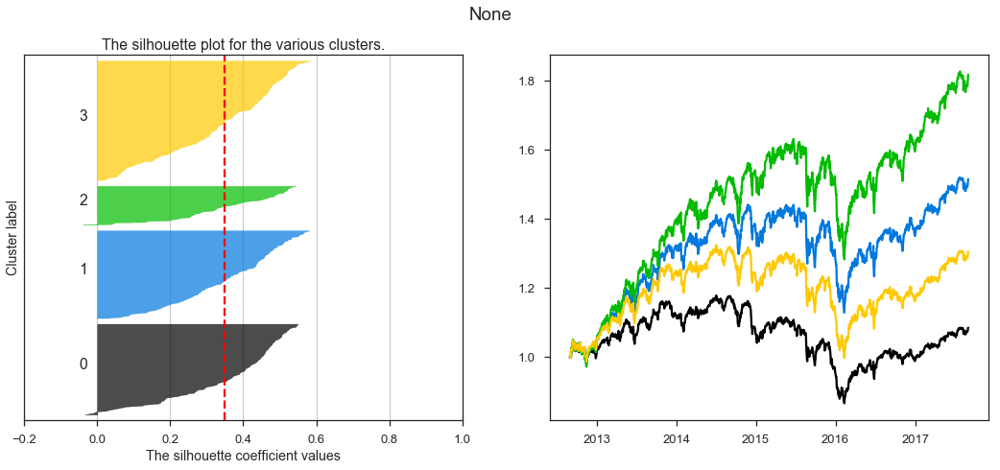

For n_clusters = 5 The average silhouette_score is : 0.311678952547


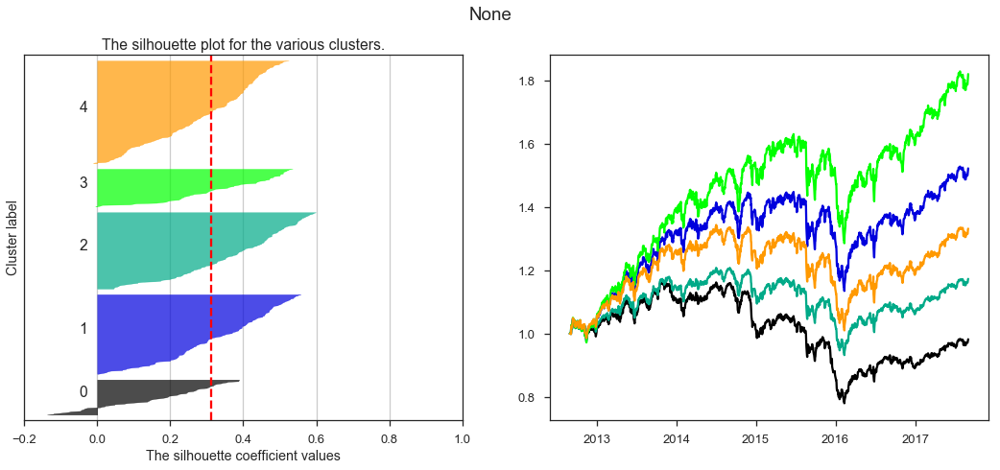

For n_clusters = 6 The average silhouette_score is : 0.288468065537


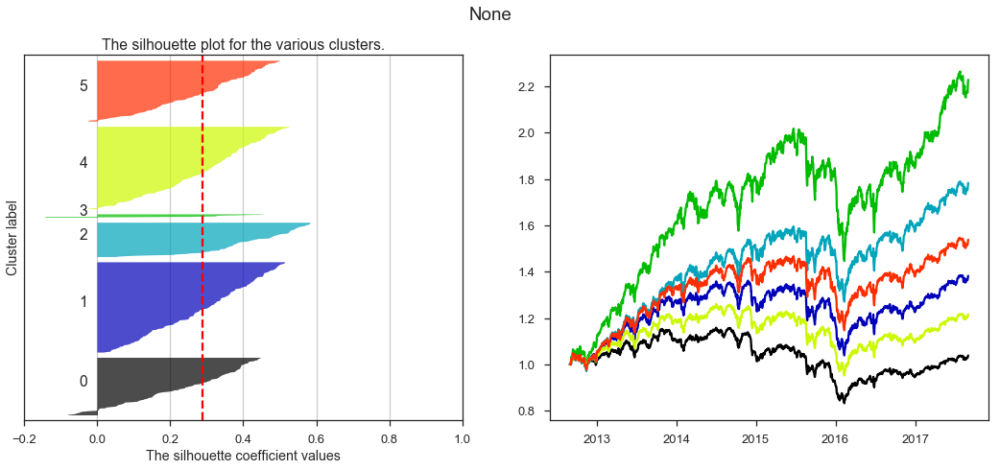

For n_clusters = 7 The average silhouette_score is : 0.280741874351


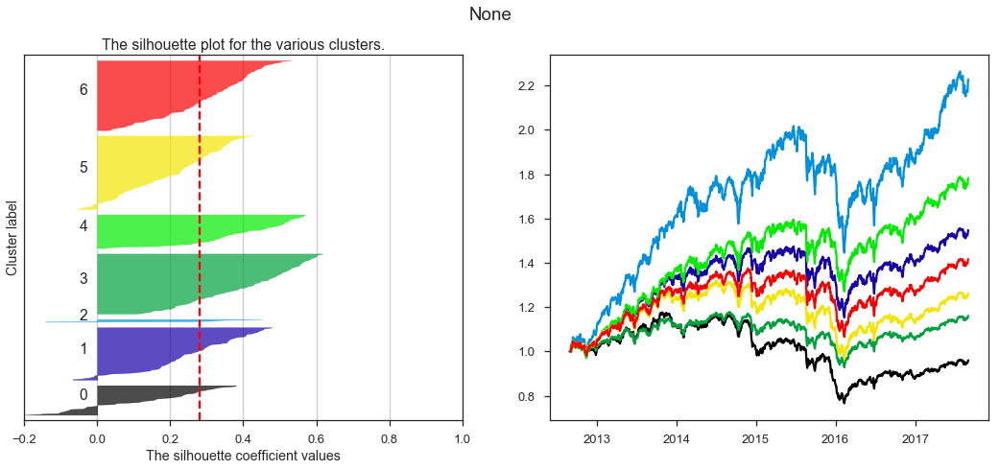

For n_clusters = 8 The average silhouette_score is : 0.275133968989


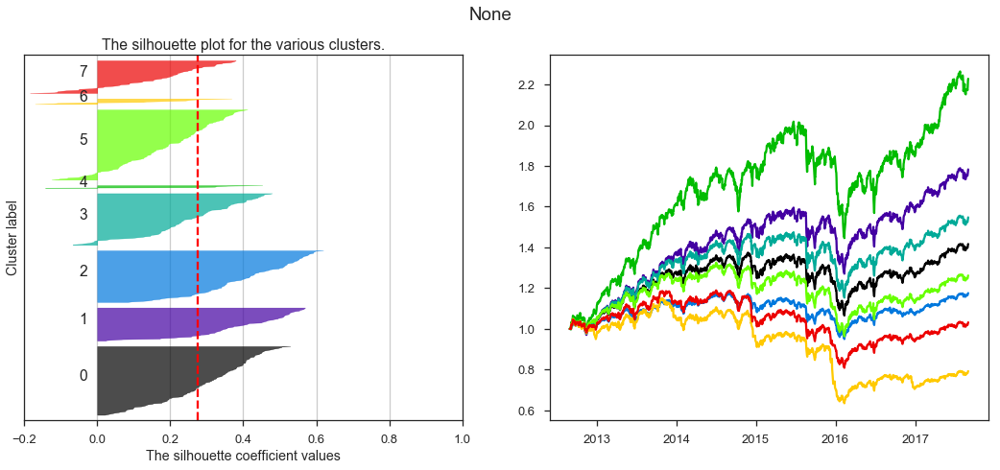

For n_clusters = 9 The average silhouette_score is : 0.270514420613


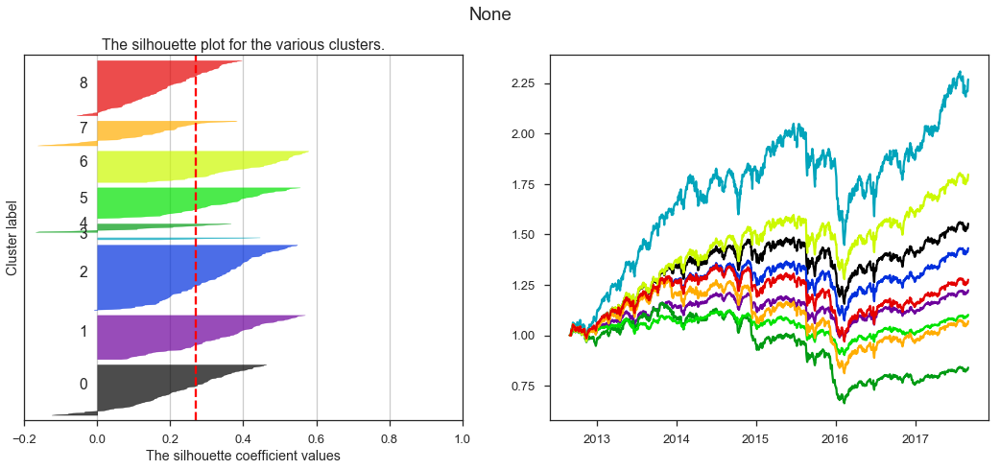

In [18]:
for k in range(2, 10):
    clusterer = KMeans(n_clusters=k, random_state=10)
    title = "KMeans silhouette plot for {} cluster centers".format(k)
    make_one_silhouette(total_return_data, clusterer)

Up until 5 clusters, the results look reasonable: at 6 clusters, at least one becomes very thin, i.e. contains very few members. But already with 5, the green cluster (3) is very thin with bad average silhouette scores. Thus, stopping at 4 makes sense. With three clusters, we have good results:

+ A well performing cluster
+ An average performing cluster and
+ a poorly performing cluster.

Let us look at the "elbow plot":

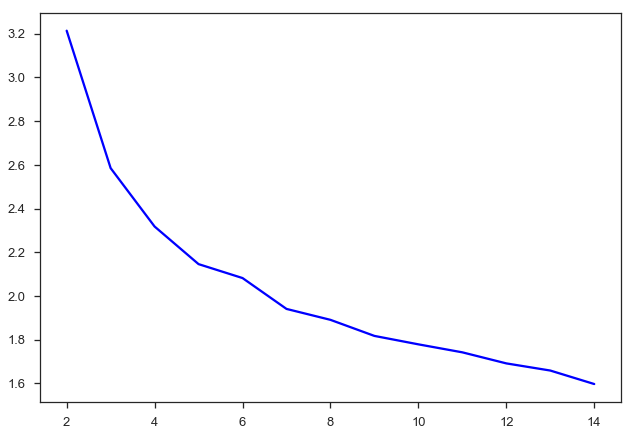

In [19]:
from scipy.spatial.distance import cdist
K = range(2, 15)
distortions = []
ch_scores = []
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(total_return_data)
    distortions.append(sum(np.min(cdist(total_return_data, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / total_return_data.shape[0])
    labels = kmeanModel.labels_
    ch_scores.append(metrics.calinski_harabaz_score(total_return_data, labels))
# Plot the elbow
plt.plot(K, distortions, 'bx-')

From the elbow plot, one could argue that around 5 the variance reduction significantly starts to decrease. From KMeans alone, we would decide that 2-5 clusters is a good choice.


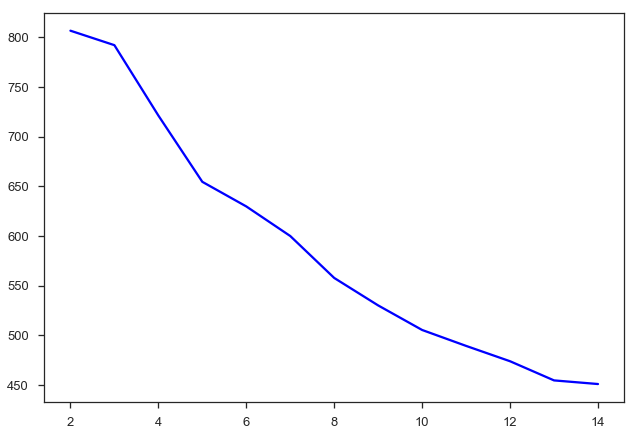

In [20]:
plt.plot(K, ch_scores, 'bx-')

For k clusters, the Calinski-Harabaz score is given as the ratio of the between-clusters dispersion mean. We can see that 2-3 clusters seem to be optimal as there is a sharp drop in for more than 3 clusters.

We proceed by trying Spectral Clustering (also implemented by us in the exploratory points):

For n_clusters = 2 The average silhouette_score is : -0.00575542593879


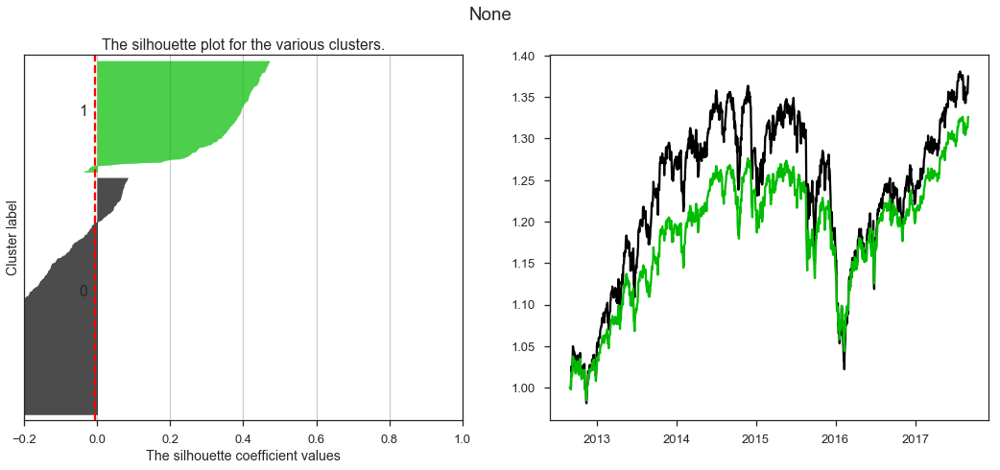

For n_clusters = 3 The average silhouette_score is : -0.0570642536739


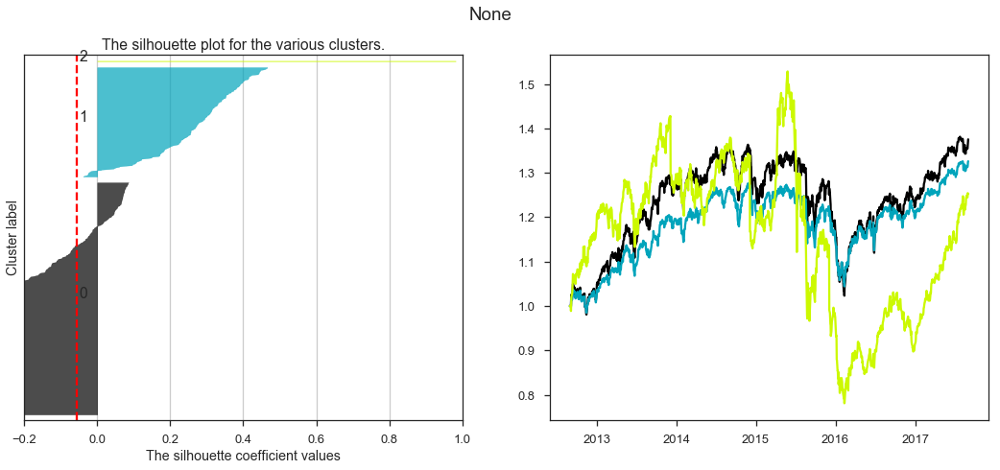

For n_clusters = 4 The average silhouette_score is : -0.136992899715


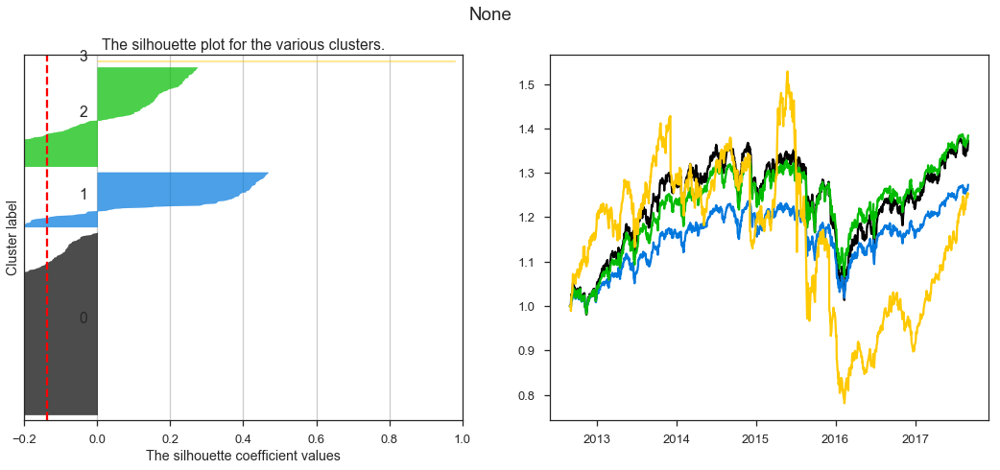

For n_clusters = 5 The average silhouette_score is : -0.166430792509


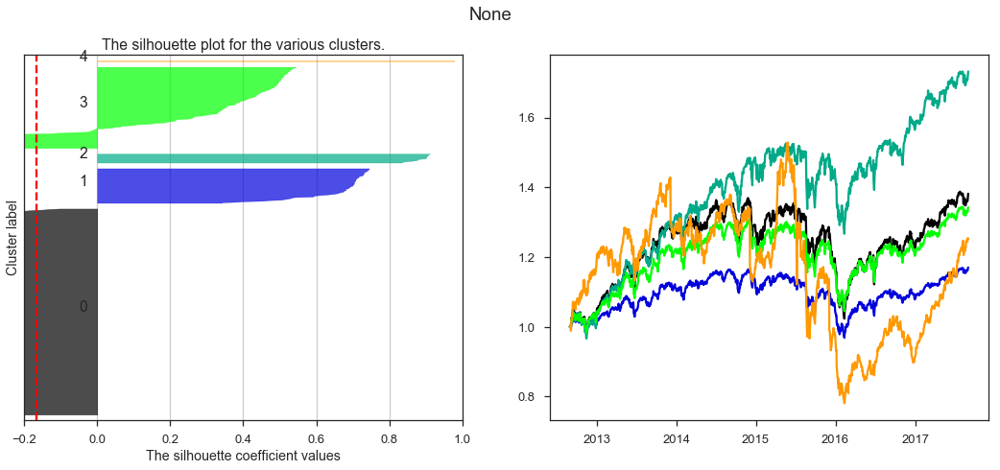

For n_clusters = 6 The average silhouette_score is : -0.123108361073


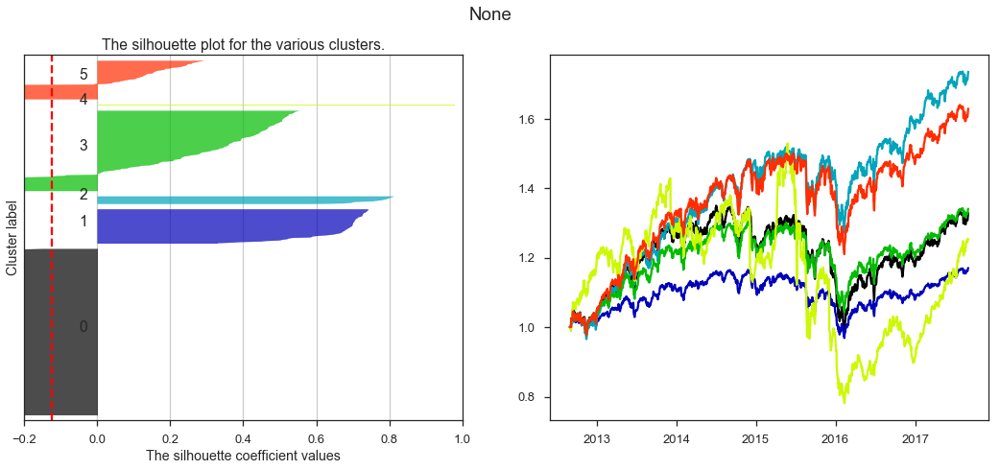

For n_clusters = 7 The average silhouette_score is : -0.238550640219


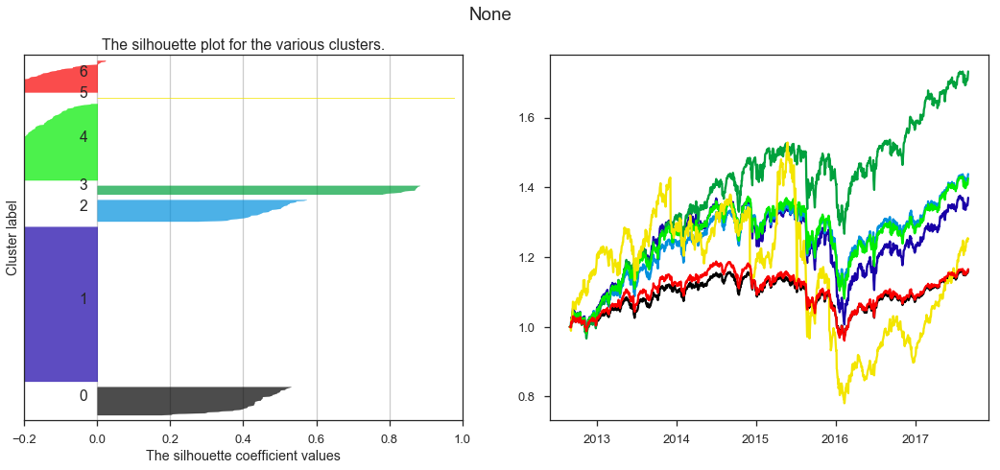

For n_clusters = 8 The average silhouette_score is : -0.178119255681


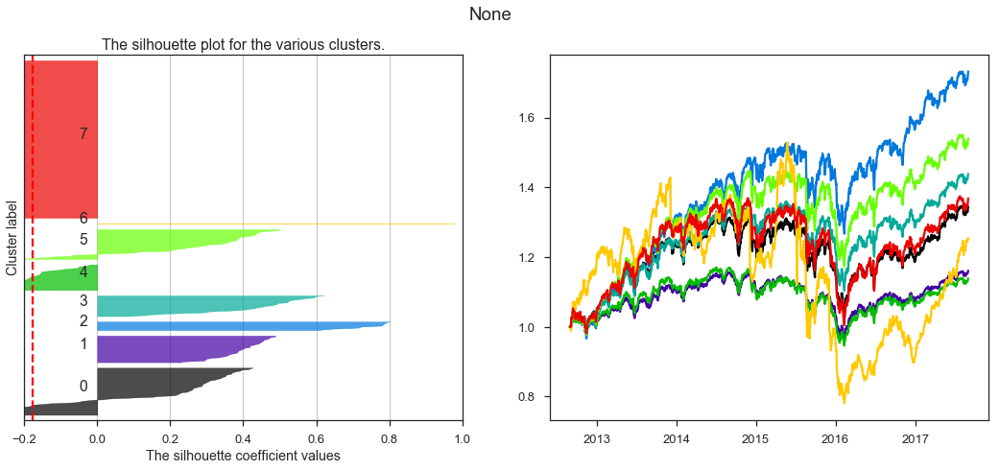

For n_clusters = 9 The average silhouette_score is : -0.175404113588


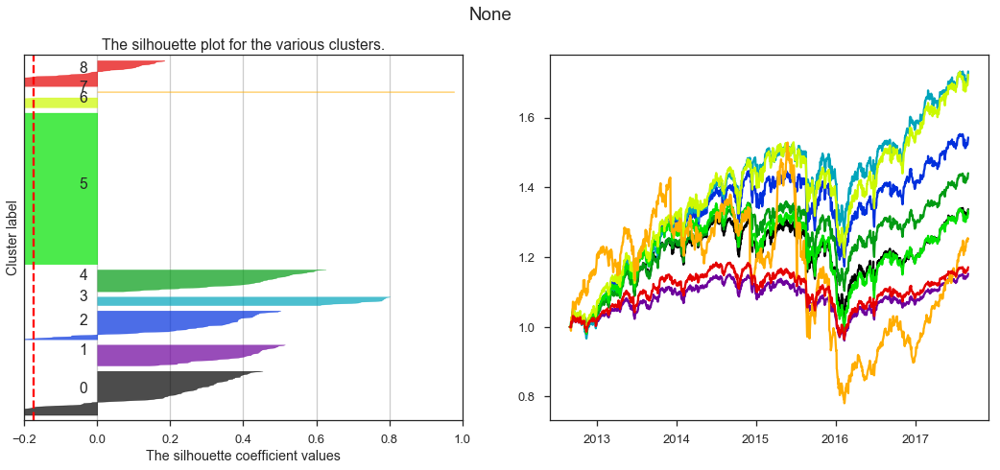

In [22]:
from sklearn.cluster import SpectralClustering
ch_scores = []
K = range(2,10)
for k in K:
    clusterer = SpectralClustering(n_clusters=k, random_state=10).fit(total_return_data)
    title = "Spectral Clutering silhouette plot for {} cluster centers".format(k)
    make_one_silhouette(total_return_data, clusterer)
    ch_scores.append(metrics.calinski_harabaz_score(total_return_data, clusterer.labels_))


Spectral clustering performs strictly worse in terms of the silhouette score and also has very small clusters. We thus decide to not use it. We try another clustering approach, namely Agglomerativeclustering (we played around with a few linkages).

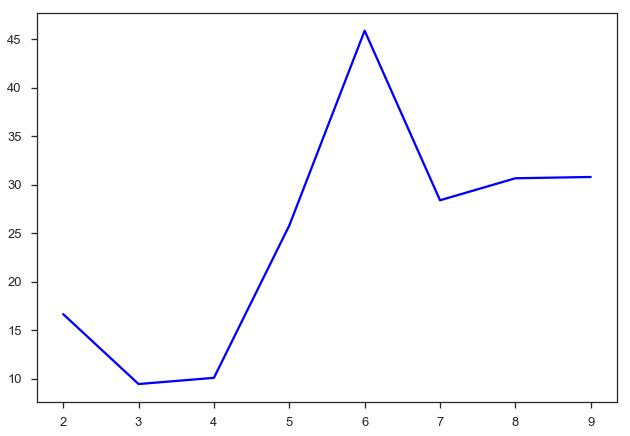

In [23]:
plt.plot(K, ch_scores, 'bx-')

From the Calinski-Harabaz score, we see the best score at 6 clusters, however, as seen with the silhouette, all cluster sizes are not well differentiated.

For n_clusters = 2 The average silhouette_score is : 0.459292861659


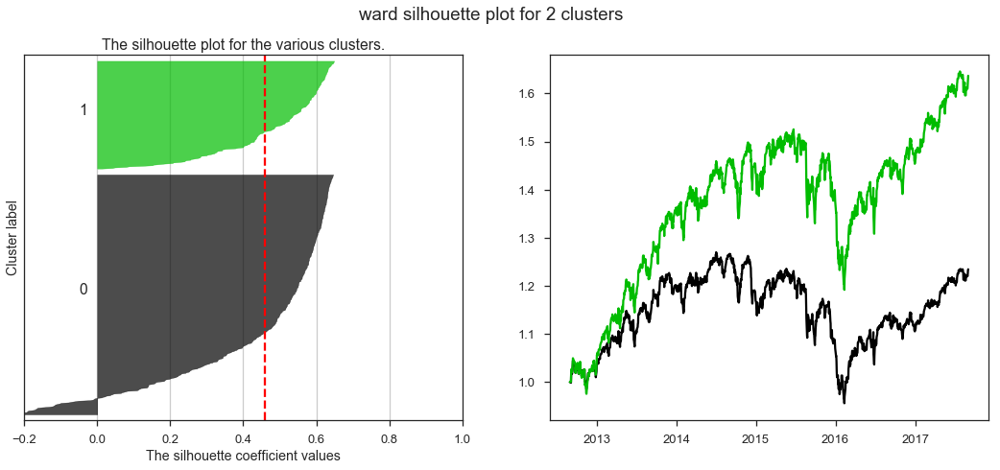

For n_clusters = 3 The average silhouette_score is : 0.368559311506


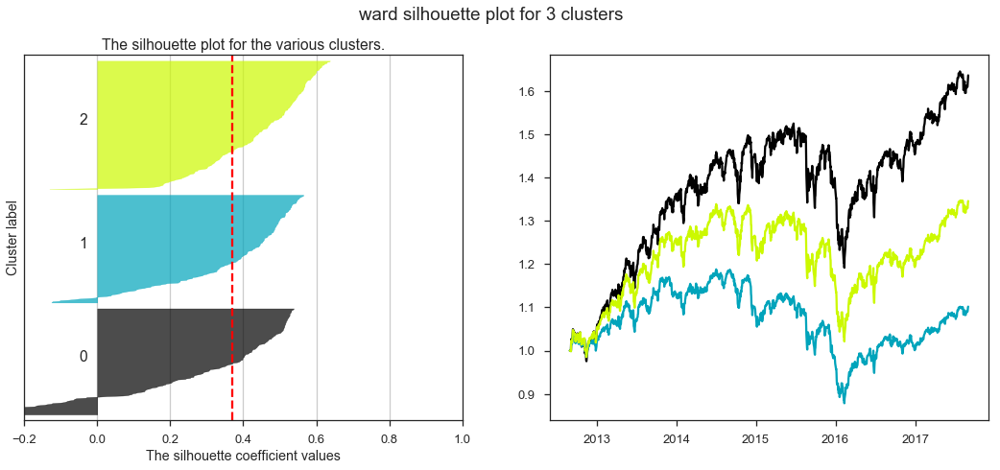

For n_clusters = 4 The average silhouette_score is : 0.340694715807


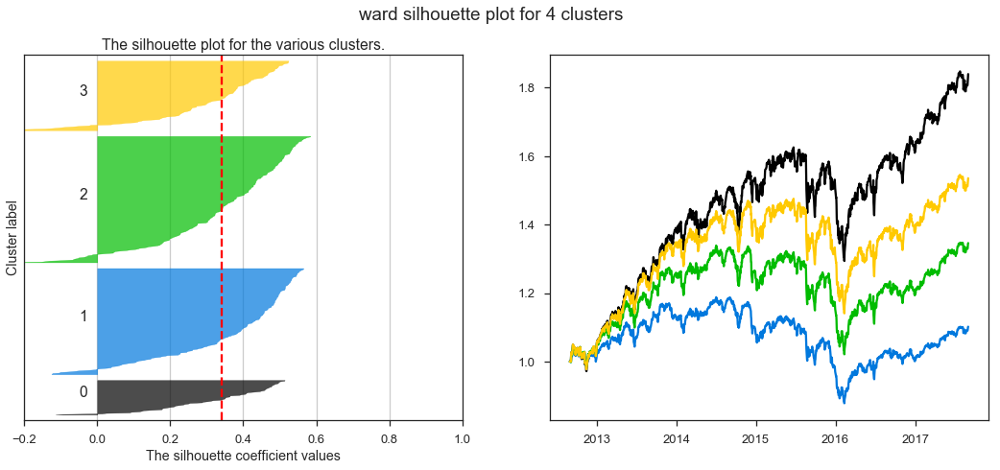

For n_clusters = 5 The average silhouette_score is : 0.343630896116


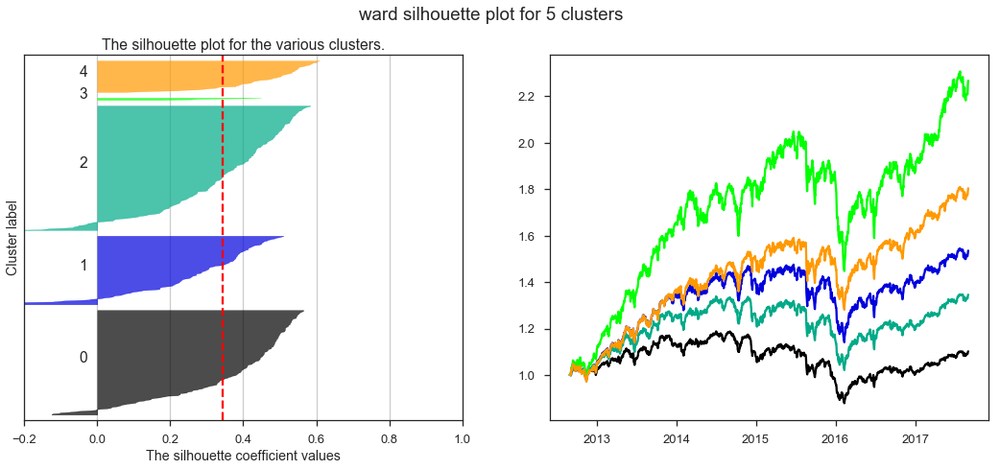

For n_clusters = 6 The average silhouette_score is : 0.331579633202


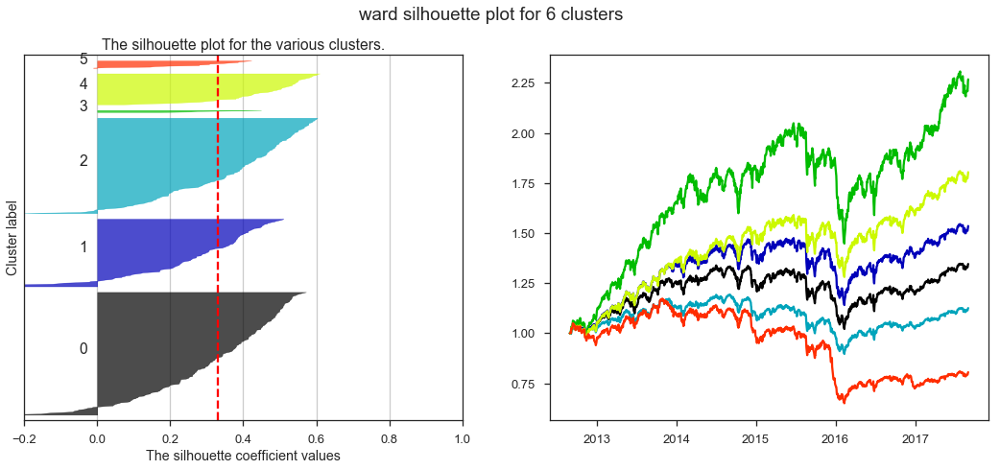

For n_clusters = 7 The average silhouette_score is : 0.257878940278


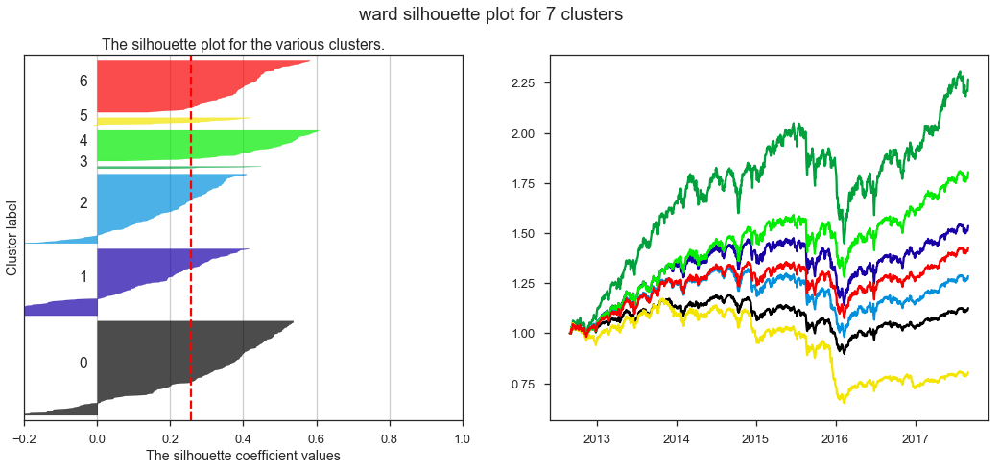

For n_clusters = 8 The average silhouette_score is : 0.212557166708


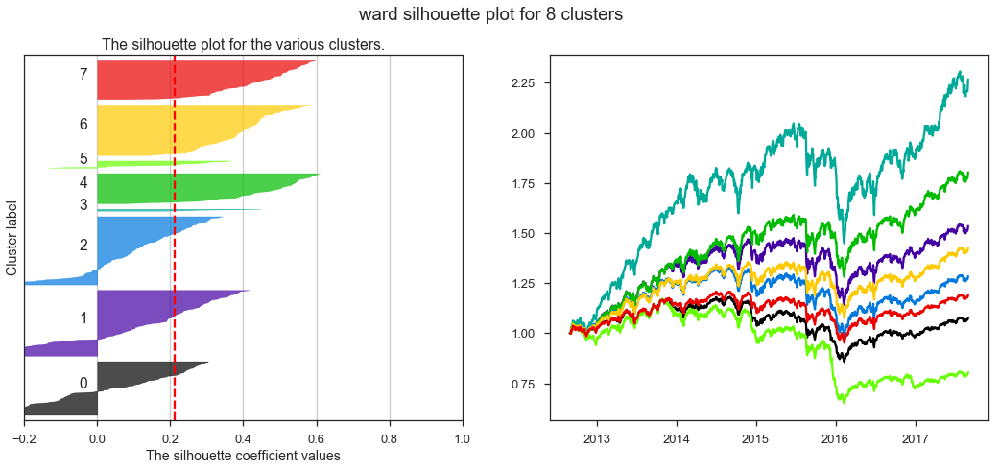

For n_clusters = 9 The average silhouette_score is : 0.234078074297


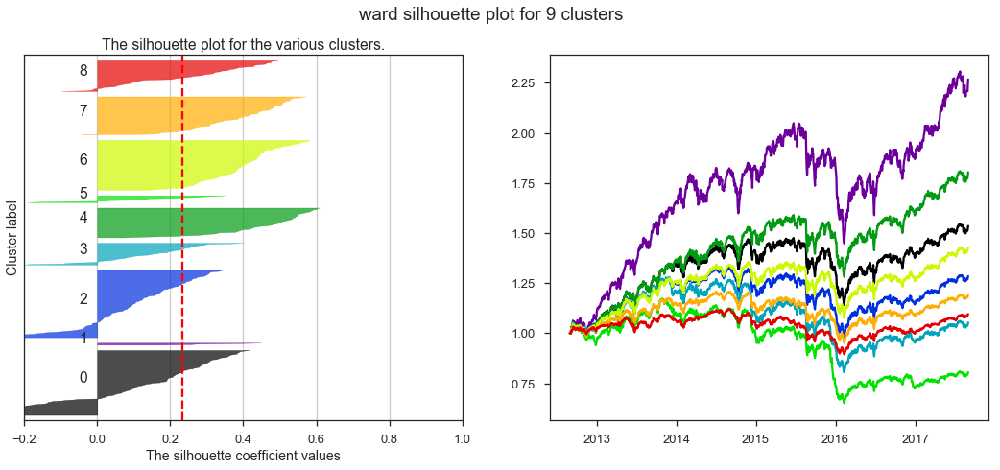

In [25]:
from sklearn.cluster import AgglomerativeClustering
ch_scores = []
for k in K:
    clusterer = AgglomerativeClustering(n_clusters=k, linkage='ward').fit(total_return_data)
    title = "ward silhouette plot for {} clusters".format(k)
    make_one_silhouette(total_return_data, clusterer, title)
    ch_scores.append(metrics.calinski_harabaz_score(total_return_data, clusterer.labels_))

Agglomerative (hierarchical) clustering looks quite similar to K-means clustering for low number of clusters.

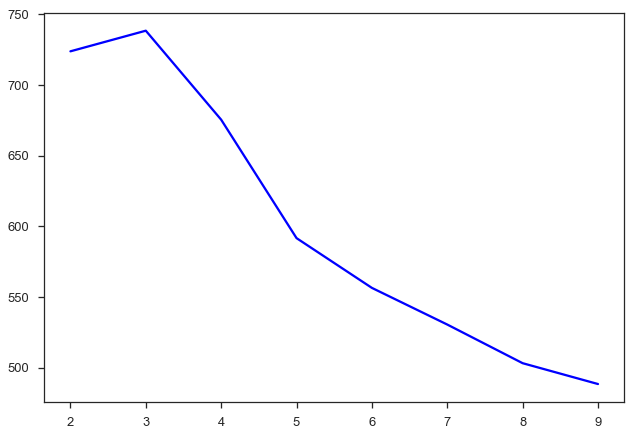

In [26]:
plt.plot(K, ch_scores, 'bx-')

Here again, we are seeing, like K means, an optimal value of 2-3 clusters.

For n_clusters = 2 The average silhouette_score is : 0.456617676466


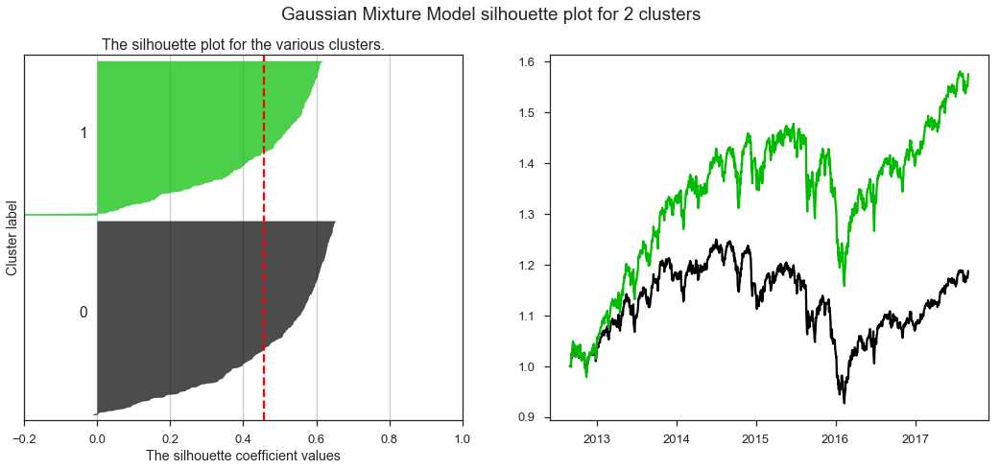

For n_clusters = 3 The average silhouette_score is : 0.378792717315


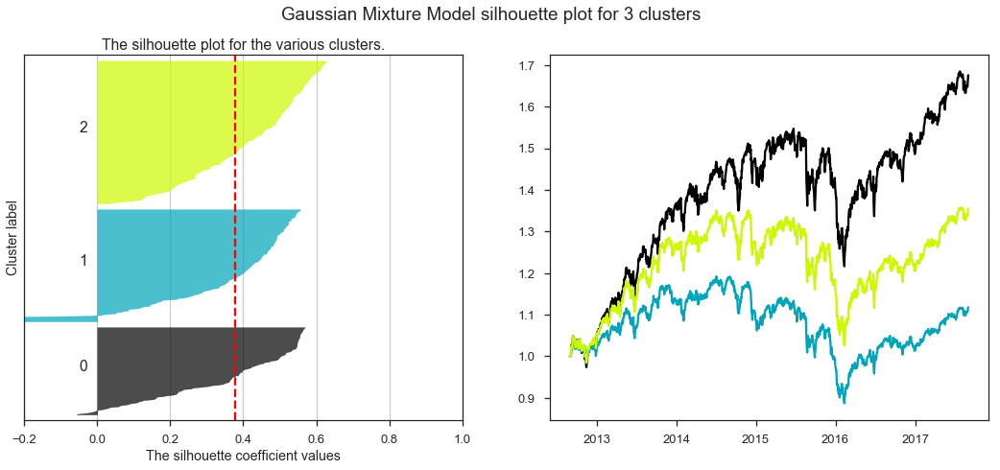

For n_clusters = 4 The average silhouette_score is : 0.341236251416


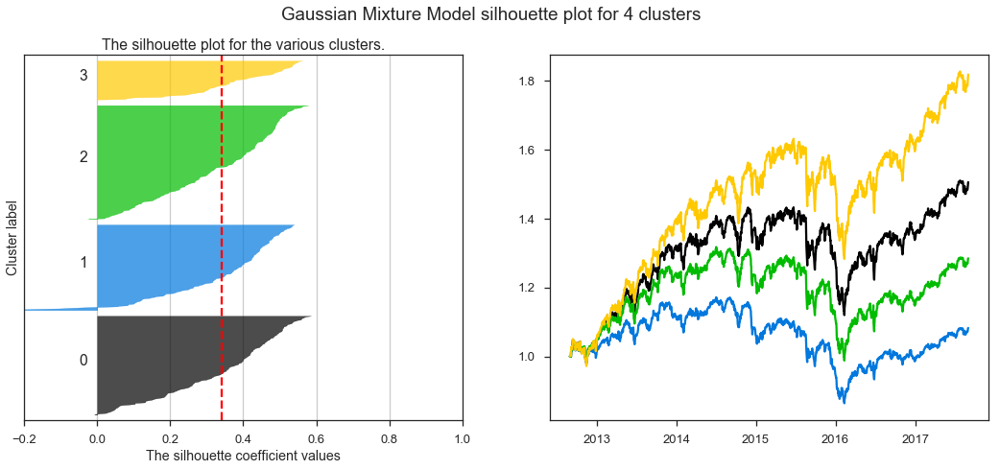

For n_clusters = 5 The average silhouette_score is : 0.292549161373


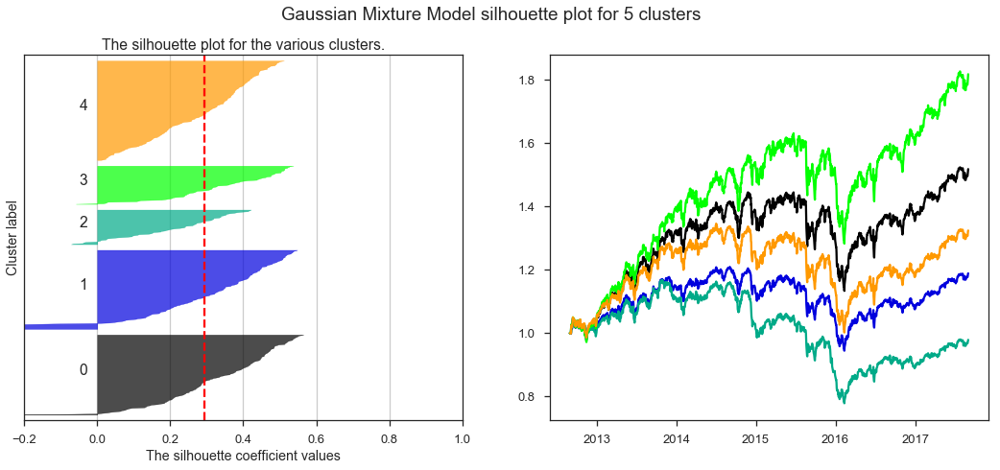

For n_clusters = 6 The average silhouette_score is : 0.293704022377


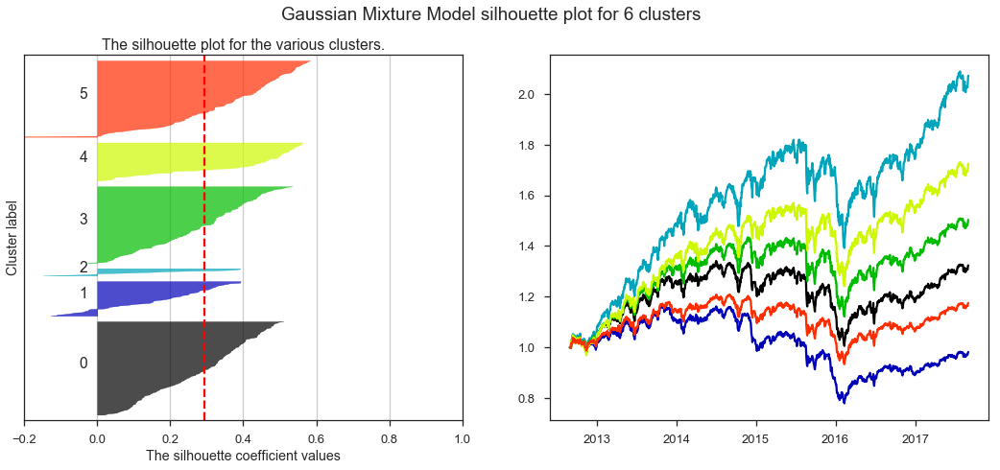

For n_clusters = 7 The average silhouette_score is : 0.285749509512


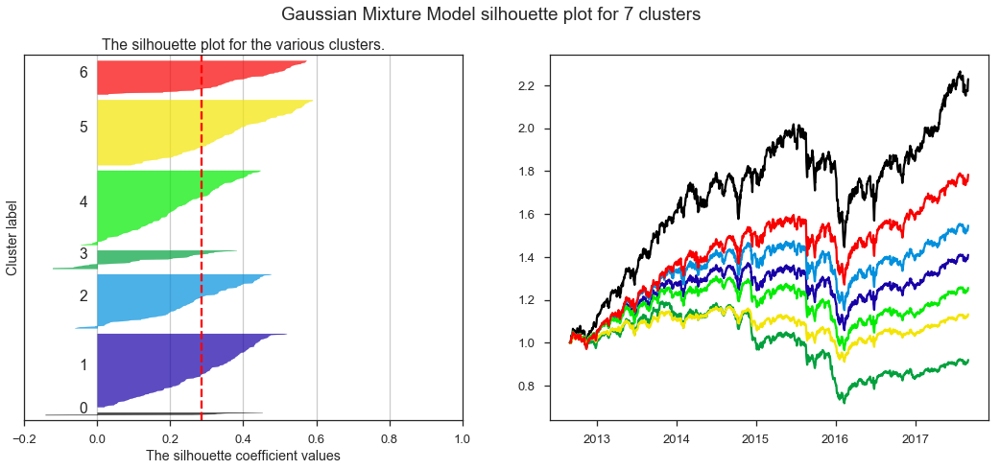

For n_clusters = 8 The average silhouette_score is : 0.265842066205


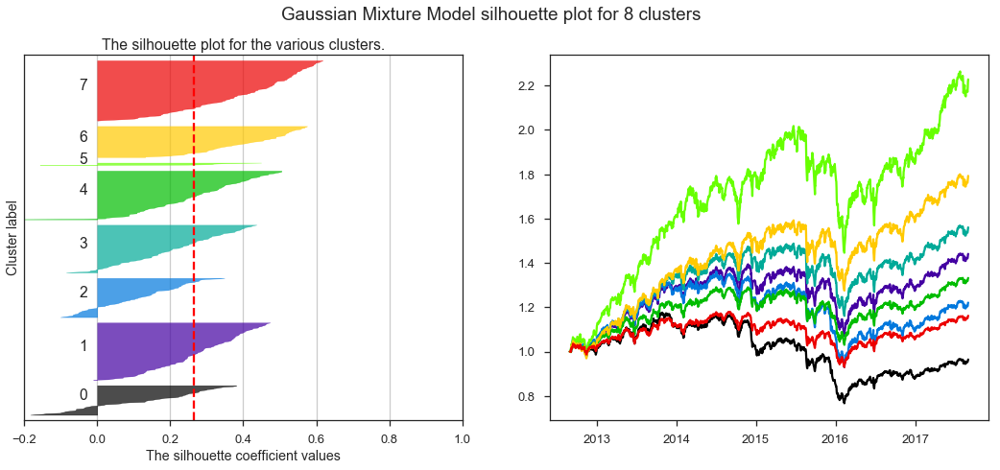

For n_clusters = 9 The average silhouette_score is : 0.254220277049


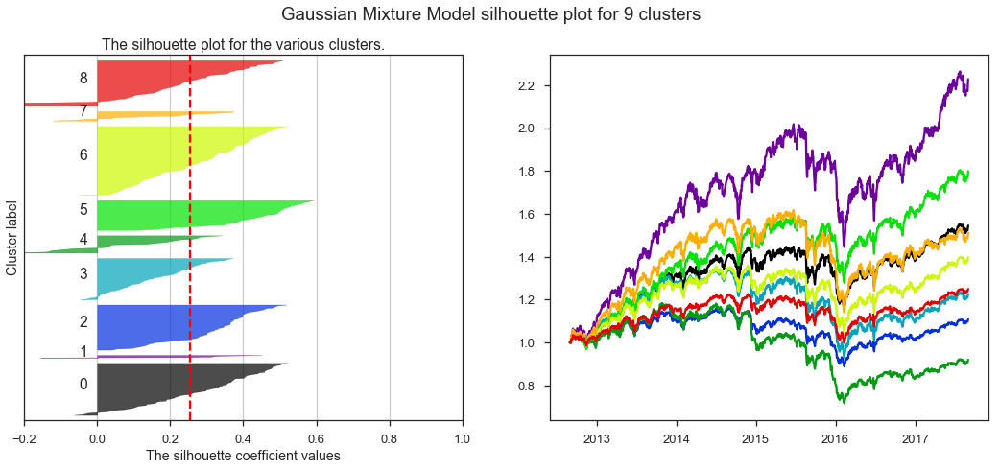

In [27]:

from sklearn.mixture import GaussianMixture
ch_scores = []
for k in K:
    gmm = GaussianMixture(n_components=k).fit(total_return_data)
    title = "Gaussian Mixture Model silhouette plot for {} clusters".format(k)
    make_one_silhouette(total_return_data, gmm, title)
    f = gmm.fit(total_return_data)
    p = gmm.predict(total_return_data)
    ch_scores.append(metrics.calinski_harabaz_score(total_return_data, p))

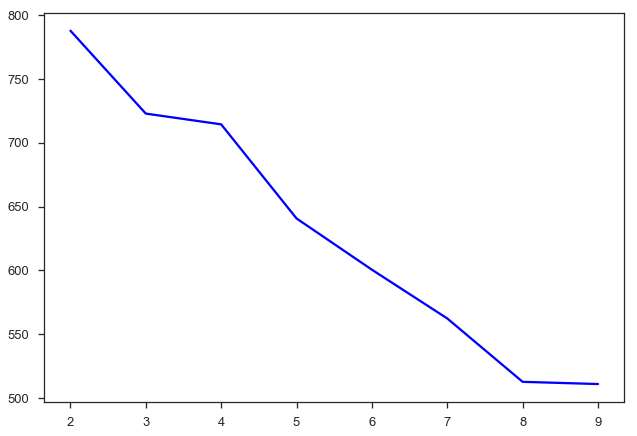

In [28]:
plt.plot(K, ch_scores, 'bx-')

We see fairly good perfomance for 2 clusters, however K means and Agglomerative Clustering seem to do a better job. As the clusters increase, we see a sharp decline in separatability.

Finally, let us try computing an affinity matrix with fast DTW and then clustering using affinity propagation.

In [29]:
import fastdtw

n_funds = return_data.shape[0]
distances = np.zeros([n_funds, n_funds])
for i in range(n_funds):
    if i % 100 == 0:
        print(i)
    distances[i, i] = 0
    for j in range(i + 1, n_funds):
        dist, _ = fastdtw.fastdtw(total_return_data.iloc[0, :], return_data.iloc[1, :])
        distances[i, j] = dist
        distances[j, i] = dist

0
100
200
300
400
500
600


In [30]:
from sklearn.cluster import affinity_propagation
_, labels = affinity_propagation(distances)
n_labels = labels.max()
print(n_labels)

102


This gives a huge number of clusters and is thus unusable.

### Problem 1b

Assess your best clustering approach using one or more appropriate techniques.  While we expect some assessment would be part of the optimization, we are asking you to justify why you selected this one as your best method.  

We chose KMeans with 3 clusters as the best clustering approach. This has the following reasons:

1. From the point of view of the silhouette score, we have a result of around 0.4.
2. The cluster center is easily interpretable: we have well performing, average performing and poor performing stocks.
3. The clusters have roughly the same size and none of them is very dominant.
4. The silhouette scores between the clusters are similarly distributed so that no cluster under-performs significantly.

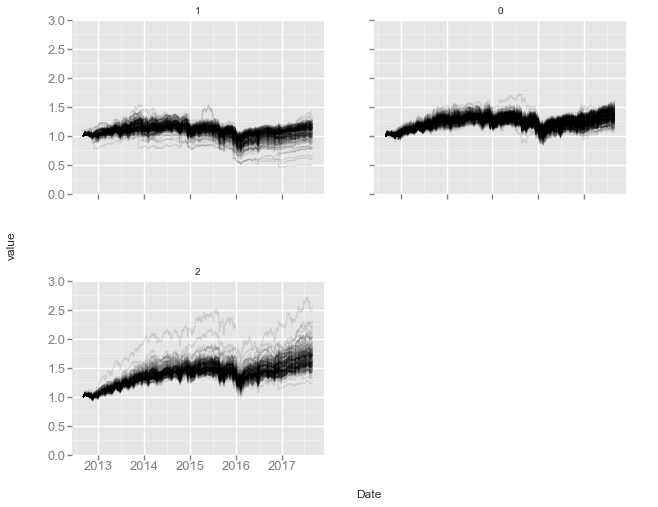

<ggplot: (-9223372036559950662)>

In [31]:
clusterer = KMeans(n_clusters=3, random_state=10)
cluster_labels = clusterer.fit_predict(total_return_data)

foo = fund_data_names
foo['cluster'] = cluster_labels
foo['cluster'] = foo['cluster'].astype('category')

foo = to_tidy(total_return_data).merge(foo)

ggplot(foo, aes(x='Date', y='value', group='index')) + \
    geom_line(alpha=0.1) + \
    facet_wrap("cluster") + \
    ylim(0, 3)

We have plotted all the individual cluster members in the subplots. What we see is that the clustering actually splits the stocks pretty nicely: there seems to be quite little overlap between the clusters (except for the beginning of the time series). They also all seem to follow similar trjectories.

### Problem 1c 

Using an approach of your choosing, compare your clustering against that of Morningstar classes.  This should not be the criteria for 1b.

We start by plotting the Mornigstar data in an aggregated way:

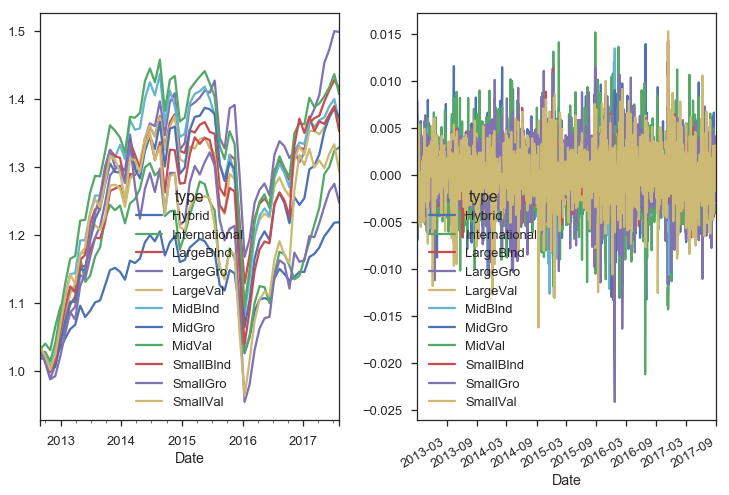

In [32]:
fig, (ax1, ax2) = plt.subplots(1, 2)

fund_data_tidy.merge(fund_data_names, on='index') \
    .groupby(['type', 'Date'], as_index=False) \
    .aggregate('mean') \
    .pivot(index='Date', columns='type', values='value') \
    .plot(ax=ax1)
    
return_data \
    .reset_index() \
    .melt(id_vars=['index']) \
    .merge(fund_data_names, on='index') \
    .groupby(['type', 'Date'], as_index=False) \
    .aggregate('mean') \
    .pivot(index='Date', columns='type', values='value') \
    .apply(lambda x: x - np.mean(x), axis=1) \
    .plot(ax=ax2, legend='top_left')
    
plt.tight_layout()

Again, we can only see something in the case of total return data.

Let us now show the confusion matrix:

In [33]:
from sklearn.metrics import confusion_matrix

cluster_labels = KMeans(n_clusters=3, random_state=10).fit_predict(total_return_data)
morningstar_labels = pd.factorize(fund_data_names['type'], sort=True)[0]

pd.DataFrame(confusion_matrix(morningstar_labels, cluster_labels)[0:11, 0:3], 
             index=pd.factorize(fund_data_names['type'], sort=True)[1])

,0,1,2
Hybrid,66,84,0
International,69,49,15
LargeBlnd,30,15,41
LargeGro,31,7,43
LargeVal,29,8,19
MidBlnd,8,2,6
MidGro,12,13,14
MidVal,9,4,11
SmallBlnd,9,3,5
SmallGro,9,8,5


Cluster 2 contains many funds of type 'LargeBind', 'LargeGro', 'LargeVal' and 'MidGro'. It contains no 'Hybrid' fund and relatively few 'International' funds. 
Cluster 0 contains many 'Hybrid' and 'International' funds.
The focus of cluster 1 is on Hybrid funds.

This also agrees with the overall performance of these types.

In [34]:
from sklearn.metrics import homogeneity_completeness_v_measure
homogeneity_completeness_v_measure(cluster_labels, morningstar_labels)

(0.14455484131808011, 0.074065335473671626, 0.097946154592725723)

We have a homogeneity score of 0.14 and a completeness score of 0.07. Both are not very high indicating that our clusting differs quite a lot from the Morningstar (which is obvious already from the number of clusters. The homogenity is equal to one if all clusters contain only labels of a single class (where class are the morningstar labels). Completeness measures if all elements of a single class are also in a single cluster (so, this is the homogeneity with switched inputs). Finally, the v_measure is an analogue of the F metric in classification.

Finally, let us plot a heatmap with the column labels being the morningstar labels: we can just confirm what we saw above: there is no obvious strong relationship.

/anaconda/lib/python3.6/site-packages/matplotlib/cbook.py:136: MatplotlibDeprecationWarning: The axisbg attribute was deprecated in version 2.0. Use facecolor instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


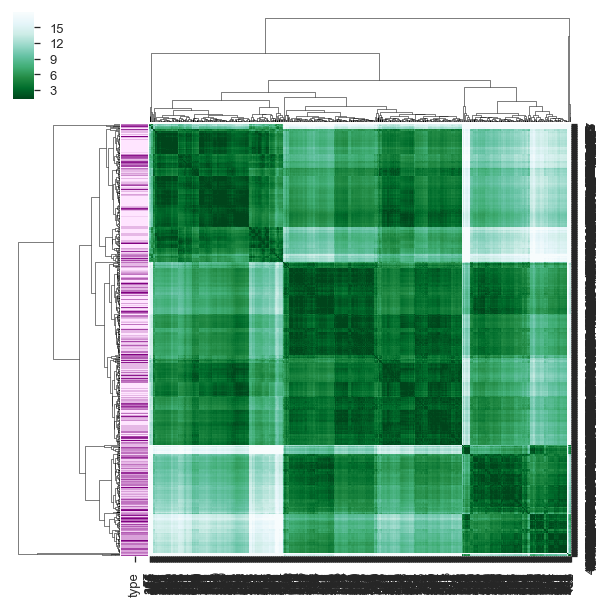

In [35]:
diss = squareform(pdist(total_return_data))
#create a color palette with the same number of colors as unique values in the Source column
network_pal = sns.light_palette('purple', len(fund_data_names.type.unique()))

#Create a dictionary where the key is the category and the values are the
#colors from the palette we just created
network_lut = dict(zip(fund_data_names.type.unique(), network_pal))

#get the series of all of the categories
networks = fund_data_names.type

#map the colors to the series. Now we have a list of colors the same
#length as our dataframe, where unique values are mapped to the same color
network_colors = pd.Series(networks).map(network_lut)

#plot the heatmap with the 16S and ITS categories with the network colors
#defined by Source column
sns.clustermap(pd.DataFrame(diss), row_colors=network_colors, cmap='BuGn_r', robust=True)

Interestingly, when we cluster the non-cummulative return data, we obtain a clustering much closer to the Morningstar one:

In [36]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()#.fit(fund_data)
kmeans = KMeans(n_clusters=11, random_state=10)

cluster_labels = KMeans(n_clusters=11, random_state=10).fit_predict(return_data)
morningstar_labels = pd.factorize(fund_data_names['type'], sort=True)[0]


print(pd.DataFrame(confusion_matrix(morningstar_labels, cluster_labels), 
             index=pd.factorize(fund_data_names['type'], sort=True)[1]))

homogeneity_completeness_v_measure(cluster_labels, morningstar_labels)

                0   1   2   3   4   5   6   7   8   9   10
Hybrid         101  37   2   0   0   0   4   0   0   0   6
International   16  20   0  74   0   1   0   0   1  21   0
LargeBlnd        2  67   2   0   1   0   3   1   0   0  10
LargeGro         0  12   0   0   1   0   4  54   0   0  10
LargeVal         1  41   1   0   1   0   1   1   0   0  10
MidBlnd          0   4   1   0   0   9   0   1   0   0   1
MidGro           0   3   2   0   2  11   4  11   0   0   6
MidVal           0  11   1   0   0   3   1   0   1   0   7
SmallBlnd        0   0   1   0   1  12   2   0   0   0   1
SmallGro         0   0   1   0   1  15   4   0   1   0   0
SmallVal         0   1   1   0   1   9   1   0   1   0   0


(0.46497398067811929, 0.44072464033053477, 0.4525246823699493)

/anaconda/lib/python3.6/site-packages/matplotlib/cbook.py:136: MatplotlibDeprecationWarning: The axisbg attribute was deprecated in version 2.0. Use facecolor instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


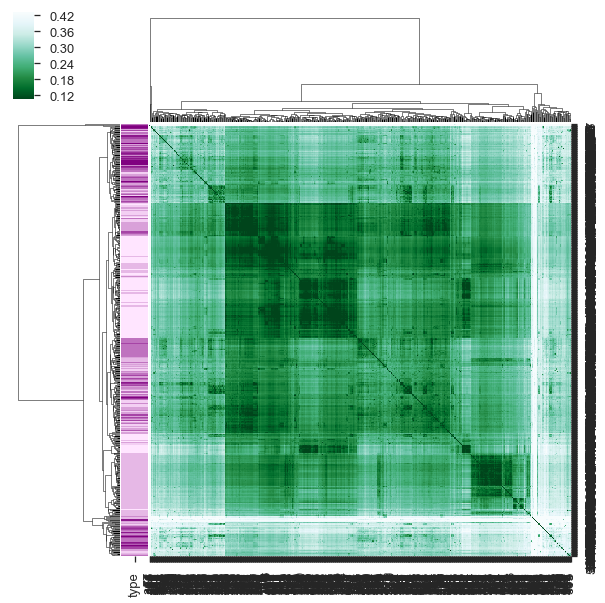

In [37]:
diss = squareform(pdist(return_data))
#create a color palette with the same number of colors as unique values in the Source column
network_pal = sns.light_palette('purple', len(fund_data_names.type.unique()))

#Create a dictionary where the key is the category and the values are the
#colors from the palette we just created
network_lut = dict(zip(fund_data_names.type.unique(), network_pal))

#get the series of all of the categories
networks = fund_data_names.type

#map the colors to the series. Now we have a list of colors the same
#length as our dataframe, where unique values are mapped to the same color
network_colors = pd.Series(networks).map(network_lut)

#plot the heatmap with the 16S and ITS categories with the network colors
#defined by Source column
sns.clustermap(pd.DataFrame(diss), row_colors=network_colors, cmap='BuGn_r', robust=True)

The heatmap shows that our clustering has something to do with the Morningstar clustering (the Morningstar labels are the shades of purple)

## Problem 2  Cluster using features (30 pts)

In lecture, we discussed that in some fields (like fish analysis), machine learning methods have provided better solutions than standard approaches.  An example of this is generating time series feature sets from the data.  Explore through this problem whether features work better than raw distances in terms of the clustering.

### Problem 2a  

Generate TSFresh features for each of the mutual fund periods.
Install the TSFresh package that will generate the features.  The quick start should be helpful at http://tsfresh.readthedocs.io/en/latest/text/quick_start.html.
The command extract_features(data, column_id="id1", column_sort="time") should be applied to the full 5 year sequence.  You may not need or want these latter parameters.

In order to use the TSFresh pacakge, we first need to bring the data into a "tidy" form:

In [38]:
total_return_data_tidy = total_return_data \
    .dropna(axis=1) \
    .resample('20d', axis=1) \
    .reset_index(inplace=False) \
    .melt(id_vars=['index'])

/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: 
.resample() is now a deferred operation
You called reset_index(...) on this deferred object which materialized it into a dataframe
by implicitly taking the mean.  Use .resample(...).mean() instead
  """Entry point for launching an IPython kernel.


We installed the latest version of `tsfresh` from GitHub: 
`pip install git+https://github.com/blue-yonder/tsfresh`

Also, we only calculate the `EfficientFCParameter`. Furthermore, we downsampled the data to one entry per 20 days.

In [39]:
from tsfresh.feature_extraction import extract_features, EfficientFCParameters
#tsfresh.feature_extraction.settings.MinimalFCParameters
from tsfresh.feature_extraction.settings import MinimalFCParameters


extracted_features = extract_features(total_return_data_tidy,
                                             column_id='index',
                                             column_sort="Date",
                                             default_fc_parameters=EfficientFCParameters())

Feature Extraction: 100%|██████████| 638/638 [00:53<00:00, 11.97it/s] 


Next, we drop columns where all features are missing.

In [40]:
extracted_features=extracted_features.dropna(axis=1)
extracted_features.shape

(638, 570)

Finally, we standardize the so extracted features and apply PCA for later use:

In [41]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(extracted_features)
extracted_features_scaled = scaler.transform(extracted_features)

In [42]:
from sklearn.decomposition import PCA
pca = PCA(n_components=10, random_state=10)
extracted_features_pca = pca.fit_transform(extracted_features_scaled)

### Problem 2b

Repeat the analysis of 1a by comparing different clustering approaches on this feature set.  

We add another helper function to make silhouette plots. In order to have values comparable to Problem 1, we calculate the silhouette scores with respect to the time series data, not the extracted features.

In [43]:
def make_one_silhouette_2(X_in, clusterer, fund_data, title=None):
    cluster_labels = clusterer.fit_predict(X_in)
    n_clusters = len(np.unique(cluster_labels))
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X_in) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(fund_data, cluster_labels)
    
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(fund_data, cluster_labels)

    y_lower = 10

    # Draw actual clusters
    colors = cm.spectral(cluster_labels.astype(float) / n_clusters)

    funds = fund_data.reset_index().loc[:, ['index']]
    funds['cluster'] = cluster_labels

    X_by_cluster = to_tidy(fund_data) \
        .merge(funds) \
        .groupby(['cluster', 'Date'], as_index=False) \
        .aggregate('mean') 

    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

        X_cluster = X_by_cluster.loc[lambda x: x.cluster == i]
        ax2.plot(X_cluster['Date'], X_cluster['value'], c=color)


    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhoutte score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    #ax1.yaxis.set_ticks_position('none')
    #ax1.xaxis.set_ticks_position('none')
    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.xaxis.grid(True)
    ax1.set_xticks([-0.2, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # Draw white circles at cluster centers
    #centers = clusterer.cluster_centers_
    plt.suptitle(title)

    #remove_border()
    plt.show()   

We first try K means:

For n_clusters = 2 The average silhouette_score is : 0.448588490216


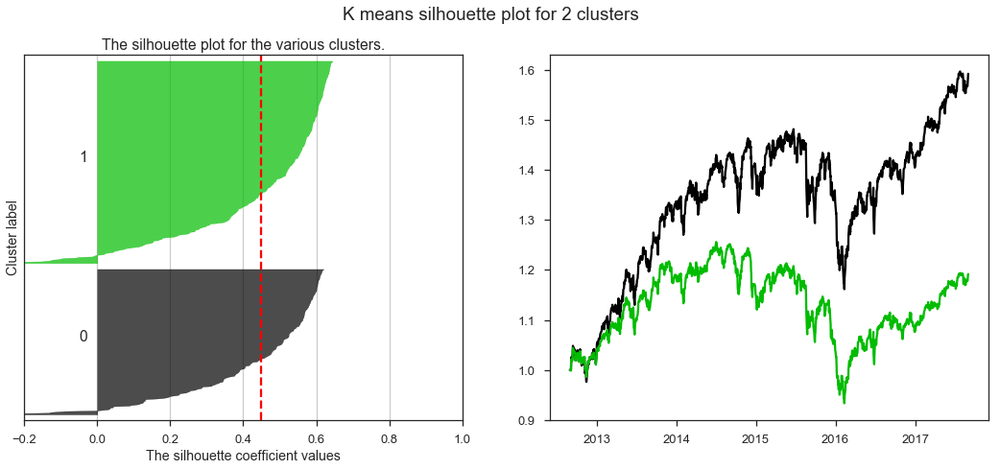

For n_clusters = 3 The average silhouette_score is : 0.36791706511


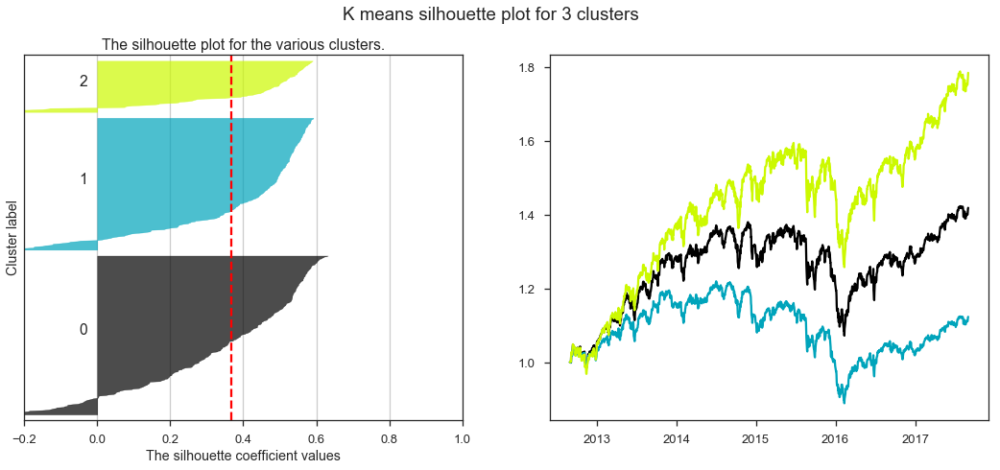

For n_clusters = 4 The average silhouette_score is : 0.288001495929


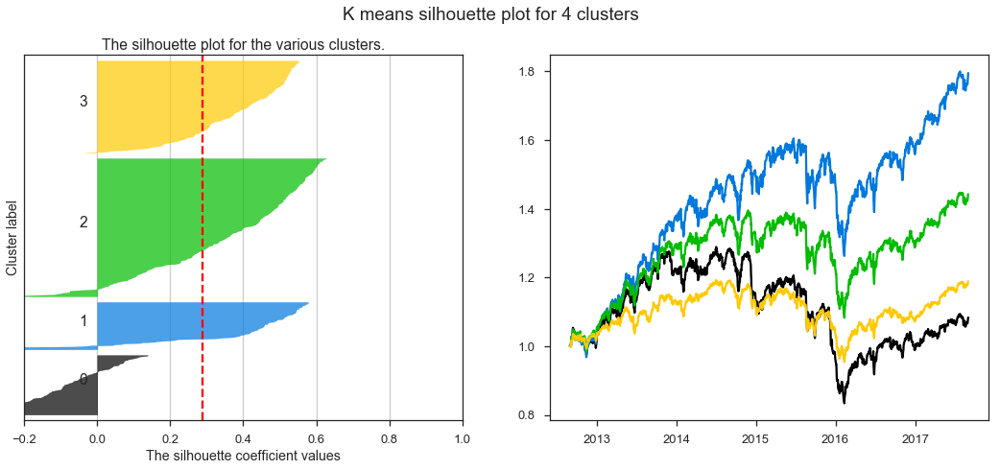

For n_clusters = 5 The average silhouette_score is : 0.265593725185


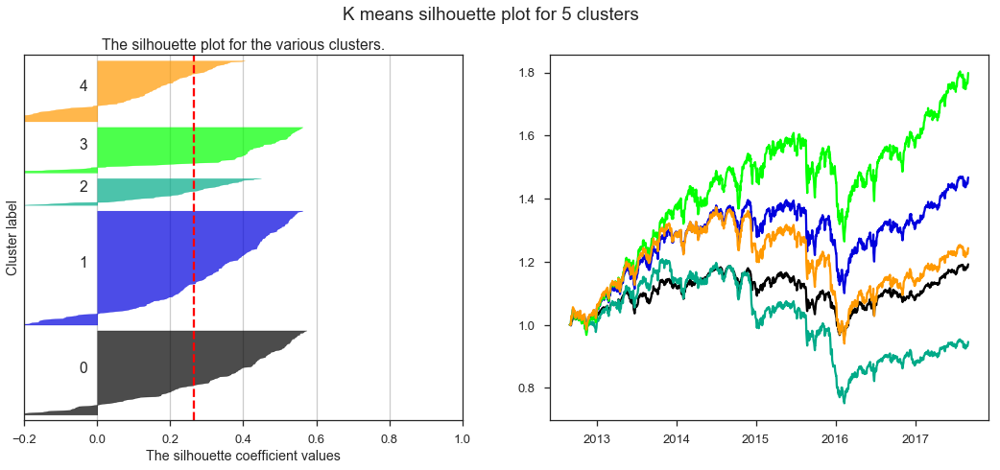

For n_clusters = 6 The average silhouette_score is : 0.219600727432


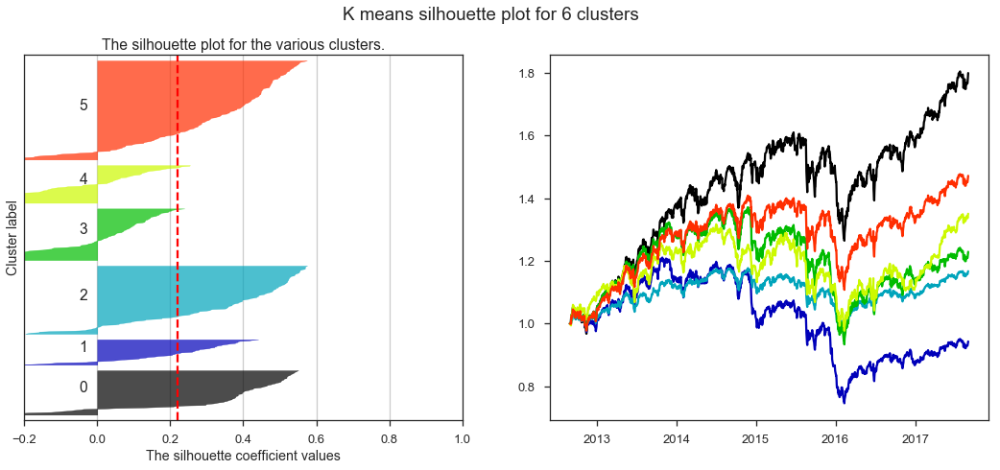

For n_clusters = 7 The average silhouette_score is : 0.225019090452


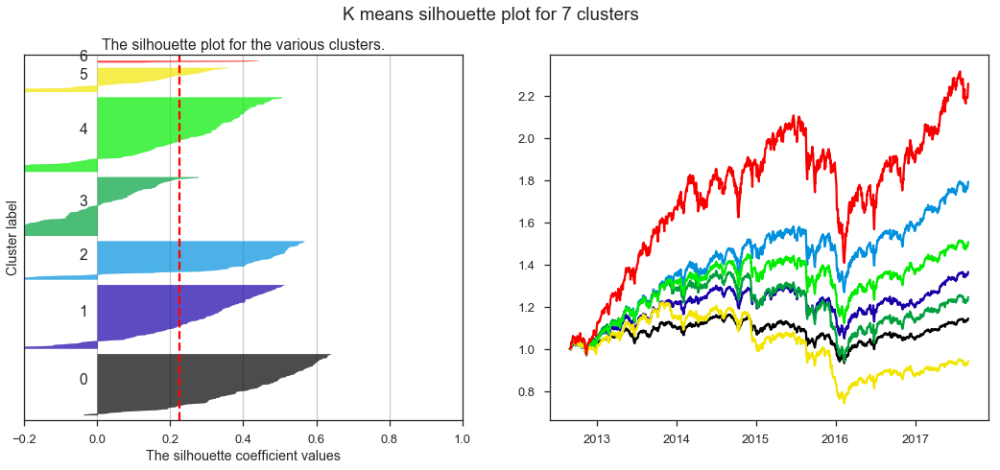

In [44]:
from sklearn.cluster import KMeans

for k in range(2, 8):
    clusterer = KMeans(n_clusters=k)
    title = "K means silhouette plot for {} clusters".format(k)
    make_one_silhouette_2(extracted_features_scaled, clusterer, total_return_data, title)

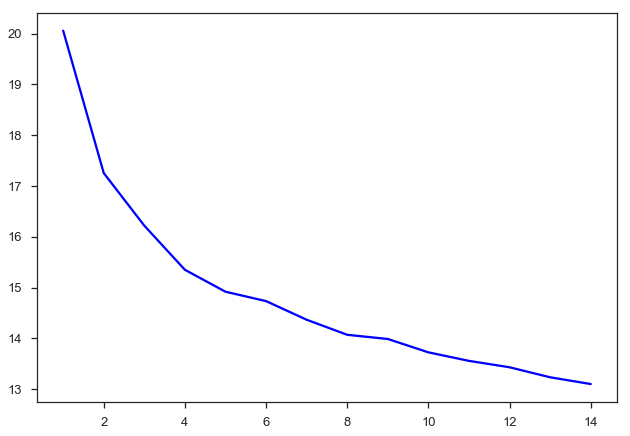

In [45]:
K = range(1, 15)
distortions = []
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(extracted_features_scaled)
    distortions.append(sum(np.min(cdist(extracted_features_scaled, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / total_return_data.shape[0])
 
# Plot the elbow
plt.plot(K, distortions, 'bx-')

We see that 2 and 3 clusters deliver reasonable results. After going to 4 clusters and above, the results deterioate: e.g. with 4 clusters, there is a cluster whose silhouette score is always below average and on average below zero. The clustering with 5 clusters looks quite good actually. The elbow plot would also indicate 3 or 4 clusters.

Next, we try agglomerative clustering: the results seem to be worse (lower silhouette score).

For n_clusters = 2 The average silhouette_score is : 0.387491962737


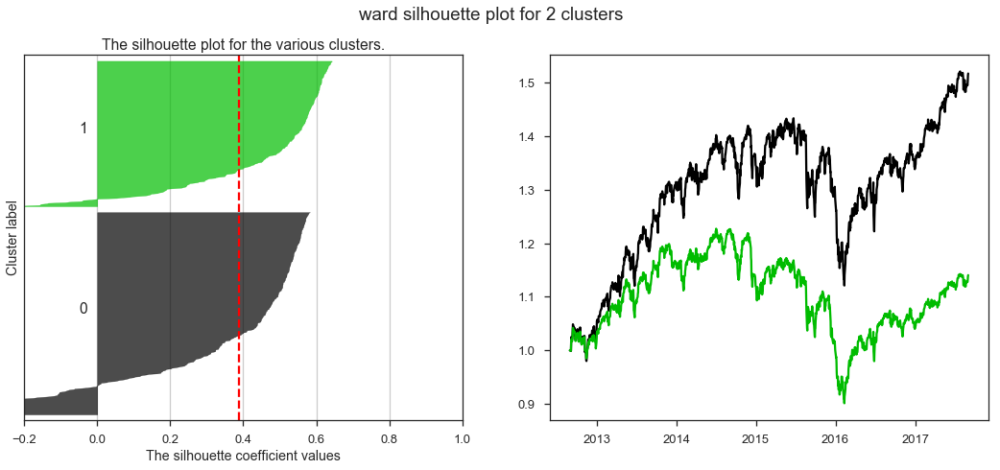

For n_clusters = 3 The average silhouette_score is : 0.332638968198


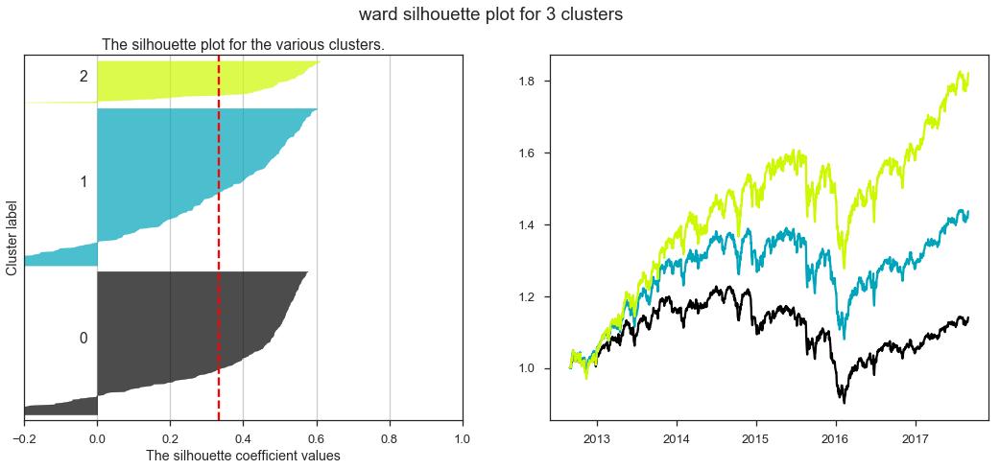

For n_clusters = 4 The average silhouette_score is : 0.251986951476


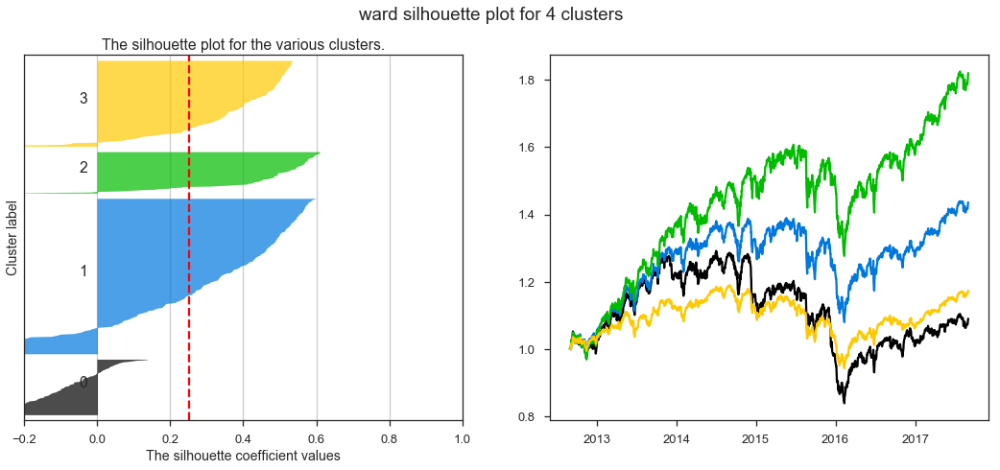

For n_clusters = 5 The average silhouette_score is : 0.22983174329


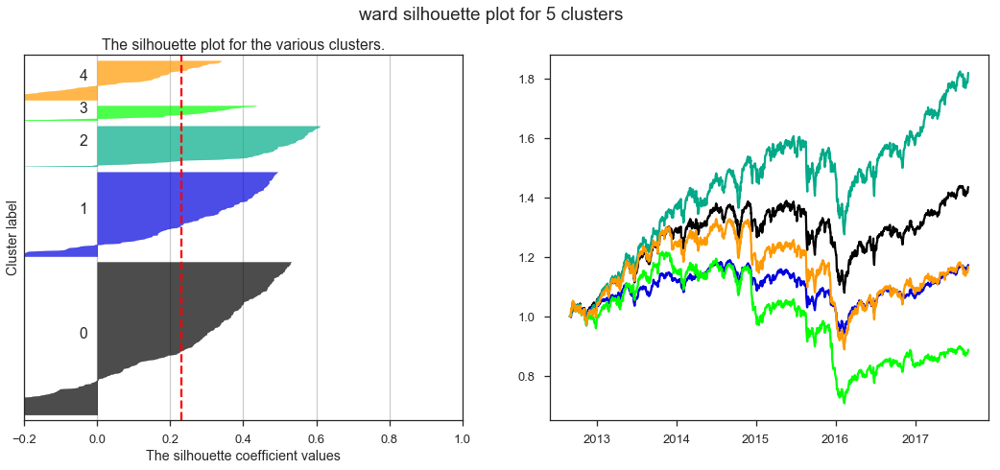

For n_clusters = 6 The average silhouette_score is : 0.156721887338


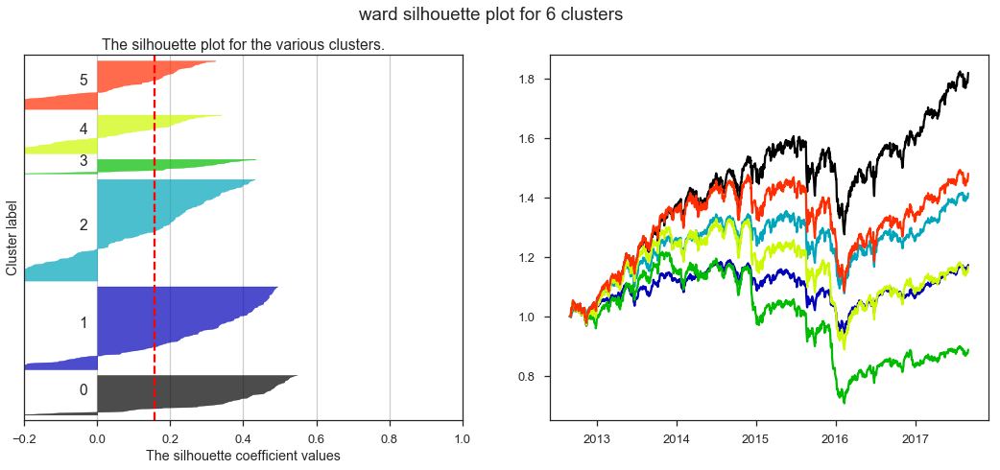

For n_clusters = 7 The average silhouette_score is : 0.159137253033


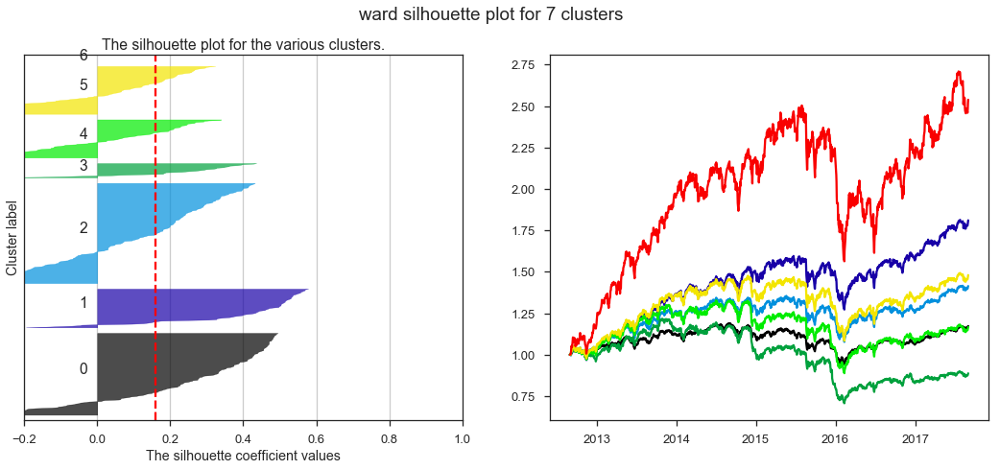

For n_clusters = 8 The average silhouette_score is : 0.134486164993


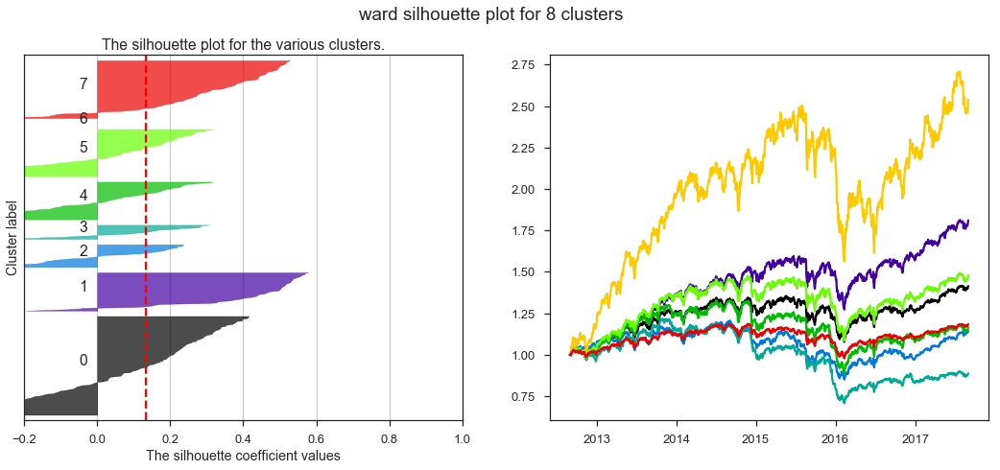

For n_clusters = 9 The average silhouette_score is : 0.111817291077


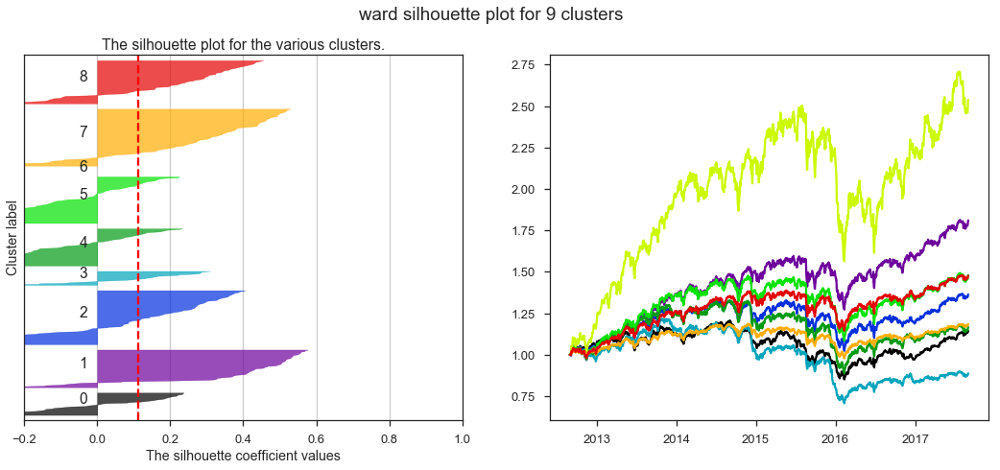

In [46]:
from sklearn.cluster import AgglomerativeClustering

for k in range(2, 10):
    clusterer = AgglomerativeClustering(n_clusters=k, linkage='ward')
    title = "ward silhouette plot for {} clusters".format(k)
    make_one_silhouette_2(extracted_features_scaled, clusterer, total_return_data, title)

For n_clusters = 2 The average silhouette_score is : 0.761170510455


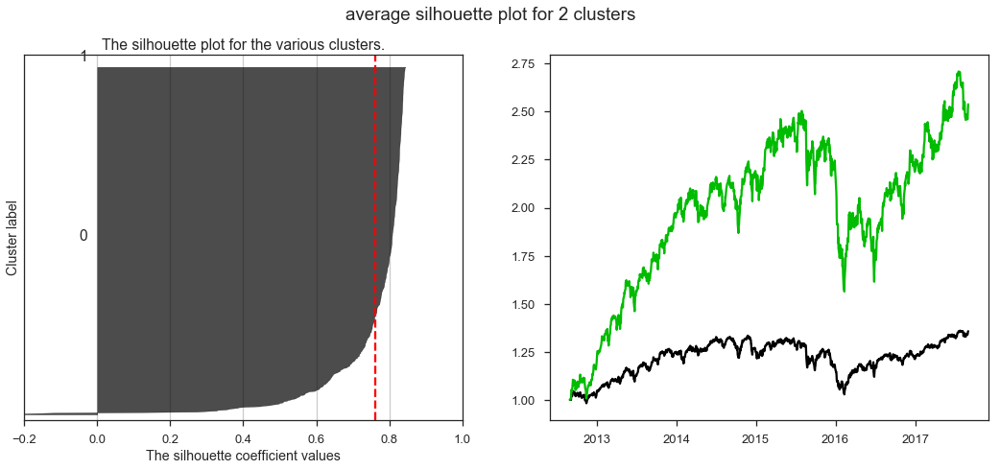

For n_clusters = 3 The average silhouette_score is : 0.50486900017


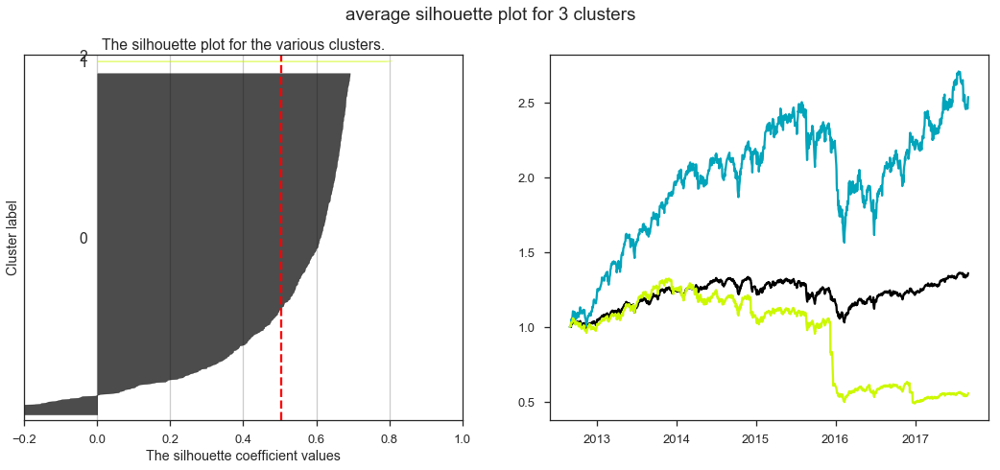

For n_clusters = 4 The average silhouette_score is : 0.393683845121


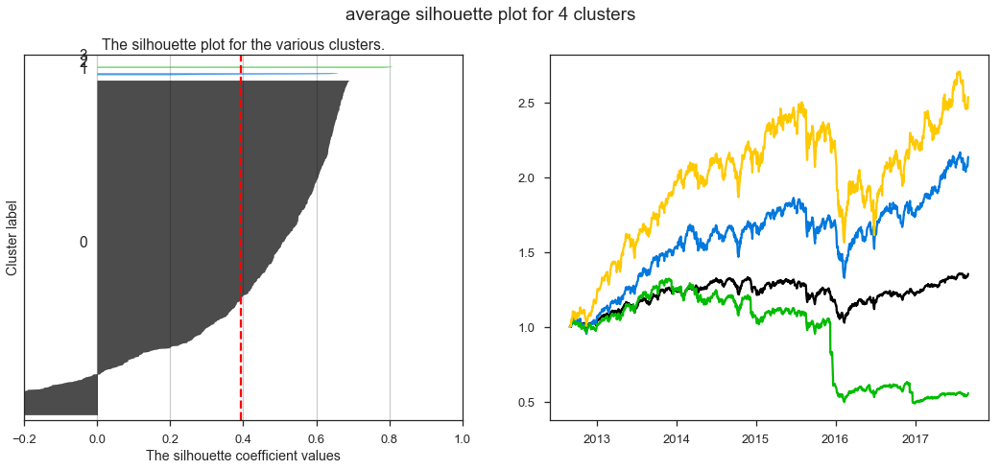

For n_clusters = 5 The average silhouette_score is : 0.111767905274


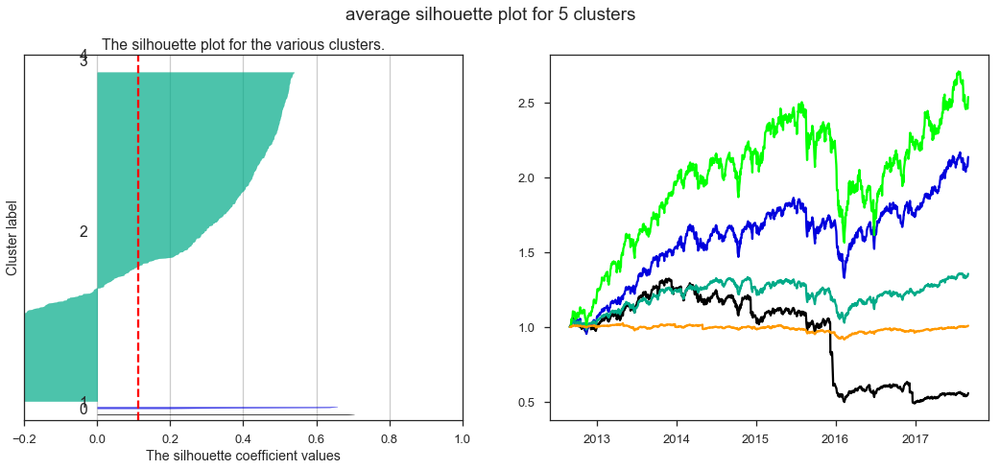

In [47]:
for k in range(2, 6):
    clusterer = AgglomerativeClustering(n_clusters=k, linkage='average')
    title = "average silhouette plot for {} clusters".format(k)
    make_one_silhouette_2(extracted_features_scaled, clusterer, total_return_data, title)

Agglomerative clustering with other linkages is a catastrophe: we only have one big cluster and the others are negligible.

Next, we try Birch:

For n_clusters = 2 The average silhouette_score is : 0.387491962737


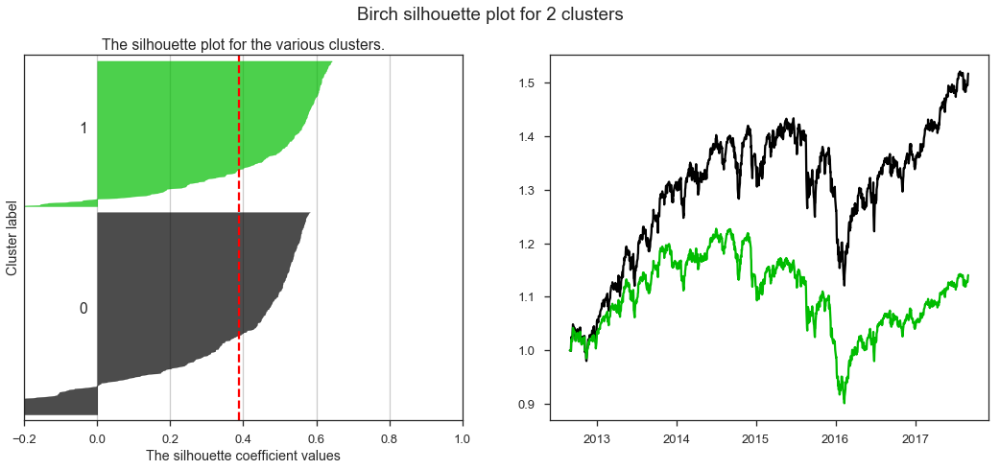

For n_clusters = 3 The average silhouette_score is : 0.332638968198


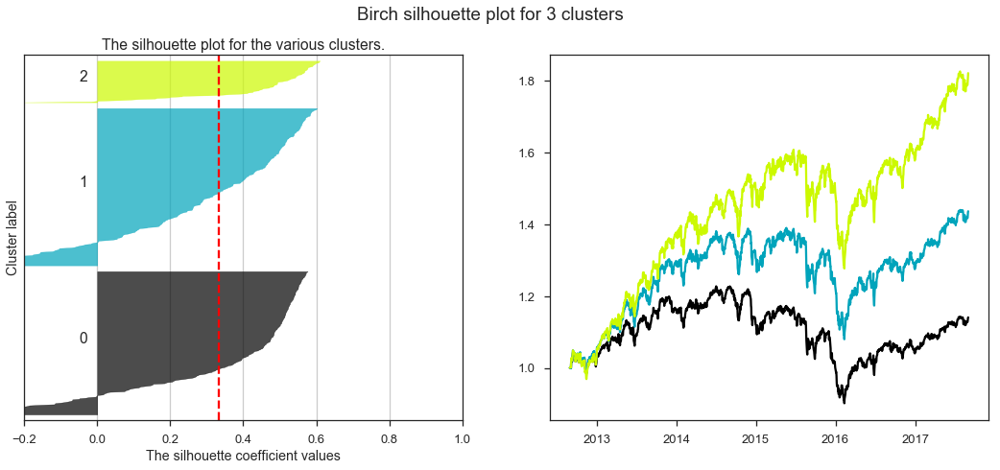

For n_clusters = 4 The average silhouette_score is : 0.251986951476


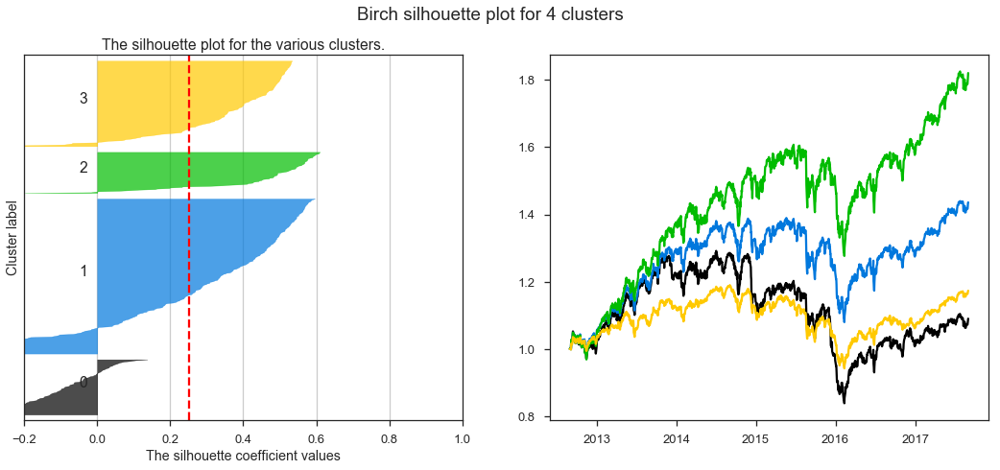

For n_clusters = 5 The average silhouette_score is : 0.22983174329


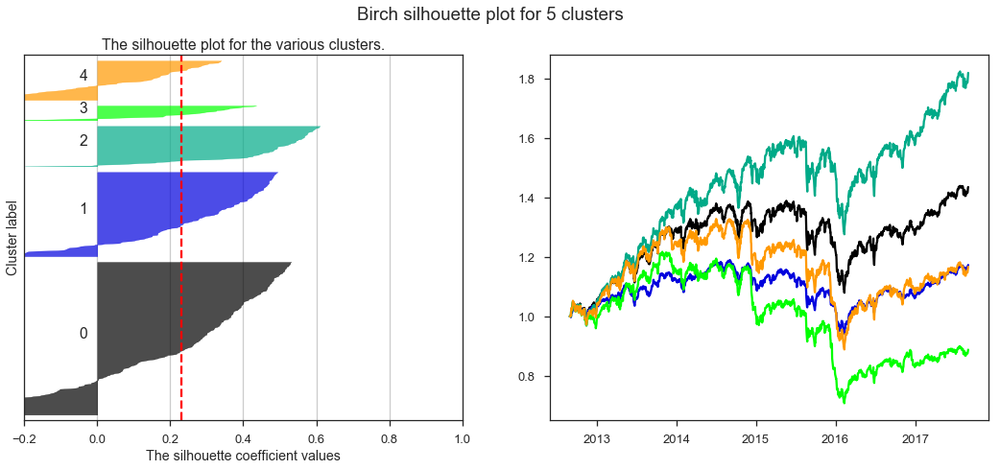

For n_clusters = 6 The average silhouette_score is : 0.156721887338


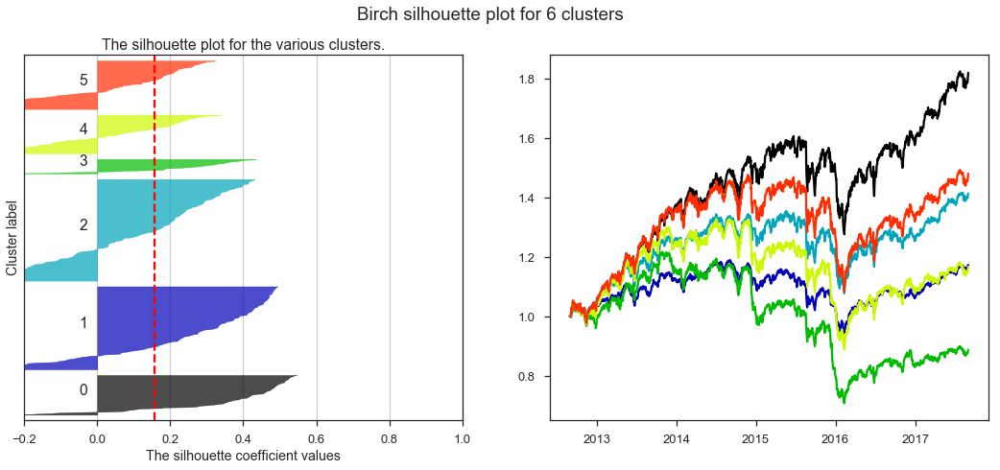

For n_clusters = 7 The average silhouette_score is : 0.159137253033


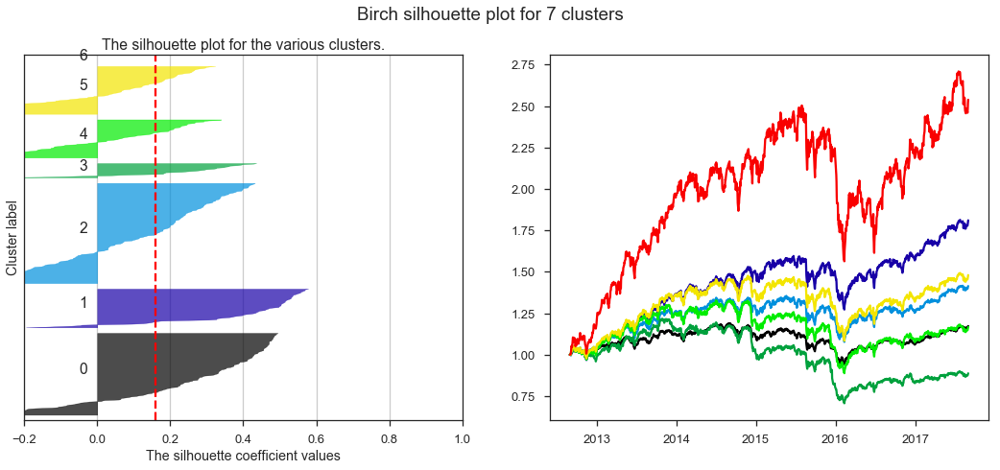

For n_clusters = 8 The average silhouette_score is : 0.134486164993


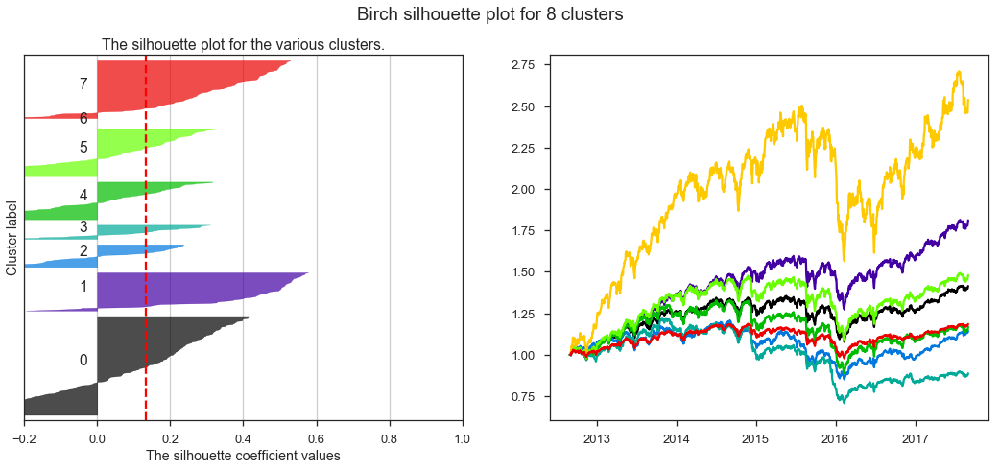

For n_clusters = 9 The average silhouette_score is : 0.111817291077


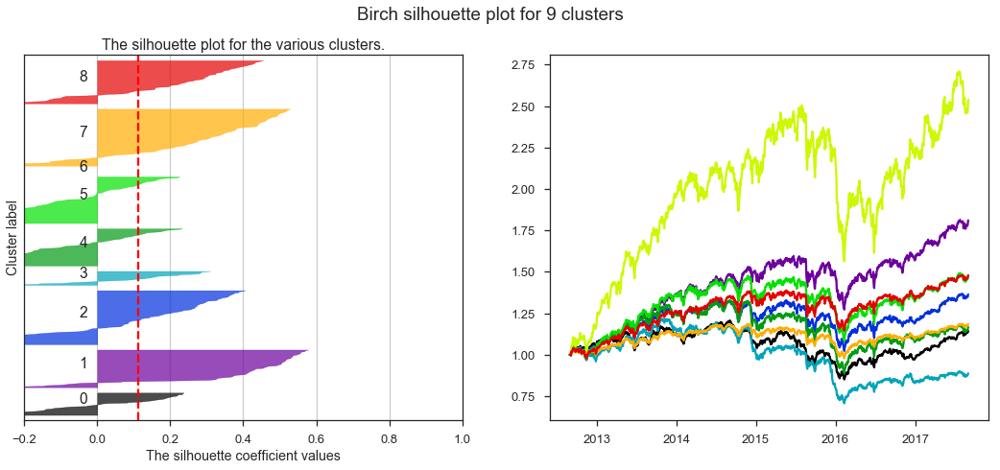

In [48]:
from sklearn.cluster import Birch

for k in range(2, 10):
    clusterer = Birch(n_clusters=k)
    title = "Birch silhouette plot for {} clusters".format(k)
    make_one_silhouette_2(extracted_features_scaled, clusterer, total_return_data, title)

Also, KMeans performs better.

Finally, let us try KMeans with PCA performed before (we also tried Agglomerative)

For n_clusters = 2 The average silhouette_score is : 0.448622693434


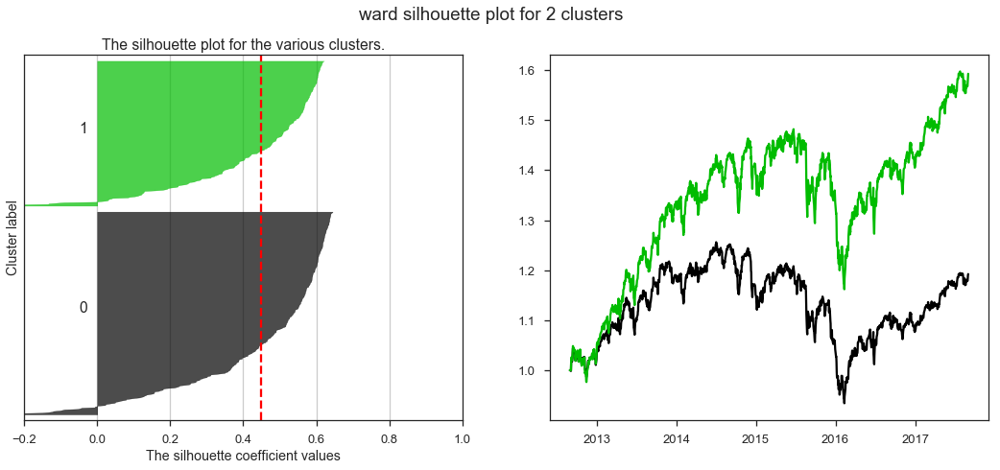

For n_clusters = 3 The average silhouette_score is : 0.364435907893


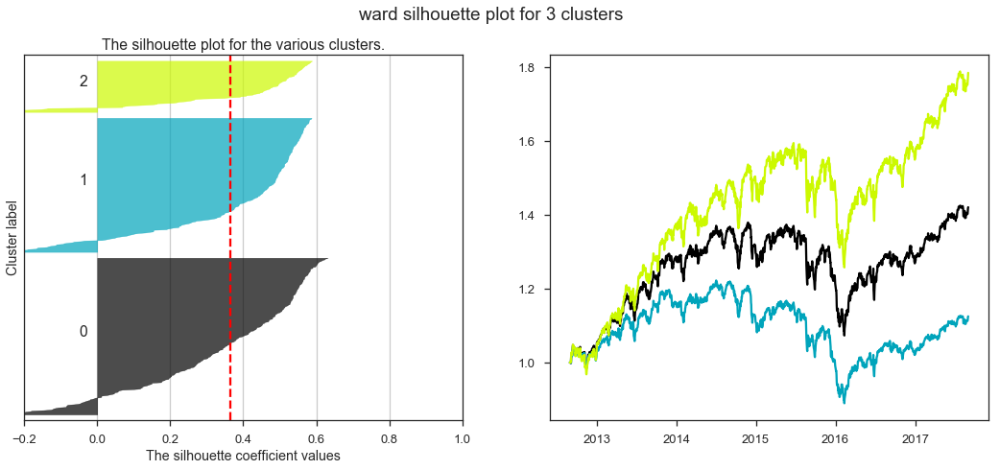

For n_clusters = 4 The average silhouette_score is : 0.281302589007


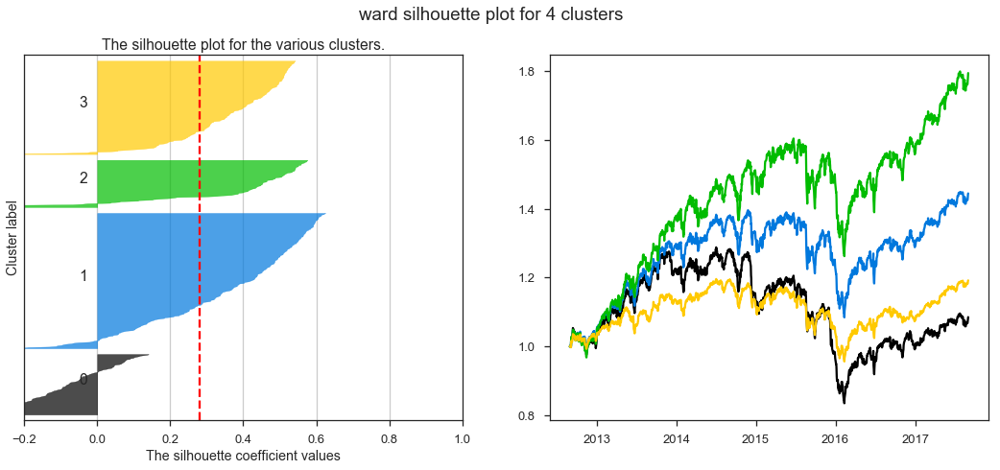

For n_clusters = 5 The average silhouette_score is : 0.264436356873


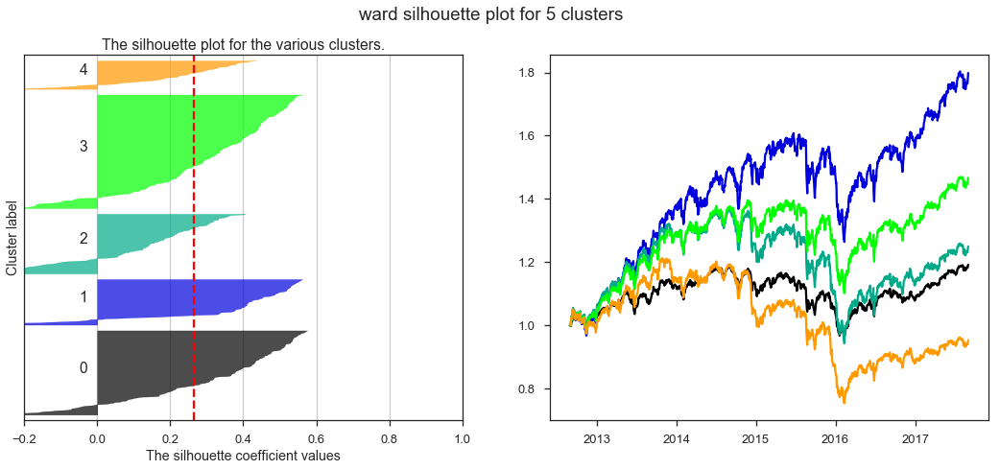

For n_clusters = 6 The average silhouette_score is : 0.220530699056


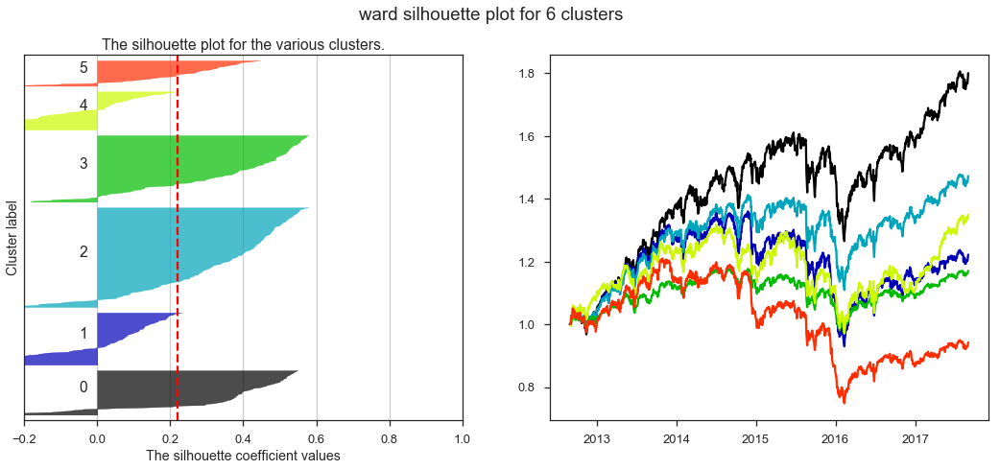

In [49]:
for k in range(2, 7):
    clusterer = KMeans(n_clusters=k, random_state=10)
    title = "ward silhouette plot for {} clusters".format(k)
    make_one_silhouette_2(extracted_features_pca, clusterer, total_return_data, title)

This also does not perform better (or significantly different) than without PCA.

Ultimately, we decide to use KMeans clustering with 3 clusters:

### Problem 2c

Repeat the clustering assessment of your best feature-based clustering approach.

For n_clusters = 3 The average silhouette_score is : 0.366461144775


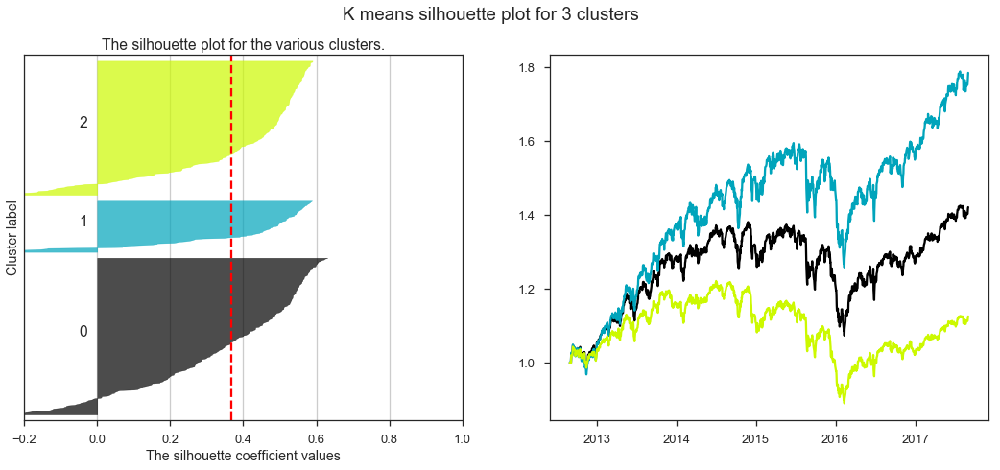

In [50]:
clusterer = KMeans(n_clusters=3, random_state=0)
title = "K means silhouette plot for 3 clusters"
make_one_silhouette_2(extracted_features_scaled, clusterer, total_return_data, title)

We see that the smallest cluster (1) is the successful one: it ends with the highest returns. The silhouette score is lower than when clustering on the raw data.

In [51]:
silhouette_score(total_return_data, clusterer.fit_predict(extracted_features_scaled))

0.36646114477458763

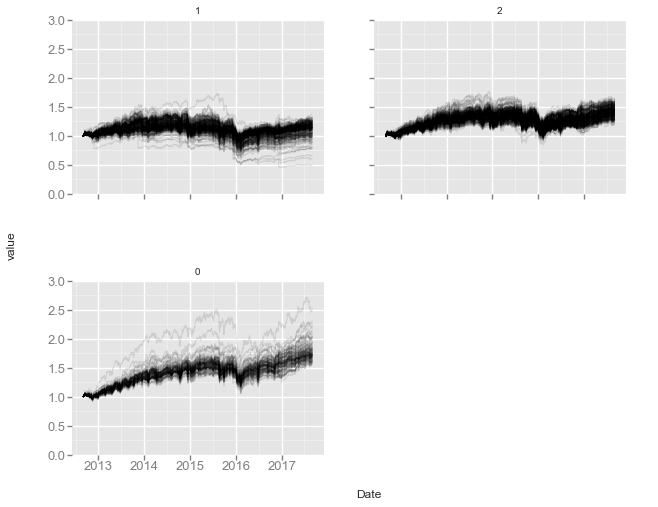

<ggplot: (-9223372036563454204)>

In [52]:
clusterer = KMeans(n_clusters=3, random_state=10)
cluster_labels_extracted = clusterer.fit_predict(extracted_features_scaled)

foo = fund_data_names
foo['cluster_extracted'] = cluster_labels_extracted
foo['cluster_extracted'] = foo['cluster_extracted'].astype('category')

clusterer = KMeans(n_clusters=3, random_state=10)
cluster_labels = clusterer.fit_predict(total_return_data)

foo['cluster'] = cluster_labels
foo['cluster'] = foo['cluster'].astype('category')

foo = to_tidy(total_return_data).merge(foo)

ggplot(foo, aes(x='Date', y='value', group='index')) + \
    geom_line(alpha=0.1) + \
    facet_wrap("cluster_extracted") + \
    ylim(0, 3)

Elements in cluster 0 tend to perform best, while funds in cluster 2 are worst. Also, note that these two clusters are well distinguished.

### Problem 2d

Compare the clustering approach of the feature-based approach to the raw time-series approach.  Which would you use?  Justify the answer.  

We would prefer the clustering from the raw data. There are several reasons:

1. The silhouette score is better.
2. The clustering using the feature space is quite intransparent: many features (around 500) are retained and then standardized. It is not clear that the best features are retained or whether we should restrict the selected features further. This seems quite plausible, but requires digging very deep into the package and the generated features. Also, the evaluation finally will happen at the level of the raw data, as this is what we can eyeball.

Let us compare the two clustering more quantitavely. First by the confusion matrix

In [53]:
confusion_matrix(fund_data_names['cluster_extracted'], fund_data_names['cluster'])

array([[  0,   0,  96],
       [ 54, 197,   0],
       [223,   1,  67]])

We see that the clusterings are quite similar. To have a numerical score of this as well, let us calculate the homogeneity, completeness and v_measures:

In [54]:
homogeneity_completeness_v_measure(fund_data_names['cluster_extracted'], fund_data_names['cluster'])

(0.60689470392758749, 0.57076475674095384, 0.58827550683957386)

## Problem 3  Dynamic Time Warping (10 pts)

### Problem 3a

For the time-series cluster containing OAKMX, compute the mean of the fund members at every close in the cluster.
If the DTW operation is computationally challenging on your computer, you have the option of downsampling the cluster and dtw.txt data file by taking the average of each 5 points.  That is, average(original[0:4]) --> new[0], average(original[5:9])-->new[1], etc.  

Plot the raw [downsampled] data aginst raw [downsampled] dtw.txt file data.


We read in the `dtw.txt` file and normalize it the same way, we normalized the fund data:

In [55]:
dtw_data = np.array(pd.read_csv("dtw.txt", header=None)).reshape(-1)
dtw_data = dtw_data / dtw_data[0]

Then we predict the clusters and get the desired within cluster average of 'OAKMX':

In [56]:
cluster_labels = KMeans(n_clusters=3, random_state=10).fit_predict(total_return_data)

clusters = total_return_data.reset_index().loc[:, ['index']]
clusters['cluster'] = cluster_labels
clusters
OAKMX_cluster = int(clusters.loc[clusters['index'] == 'OAKMX']['cluster'])

OAKMX_cluster_funds = clusters.loc[clusters['cluster'] == OAKMX_cluster]['index']

aggregated_ts = np.array(total_return_data.loc[OAKMX_cluster_funds, :].aggregate('mean', axis=0))

Finally, we plot both raw time series

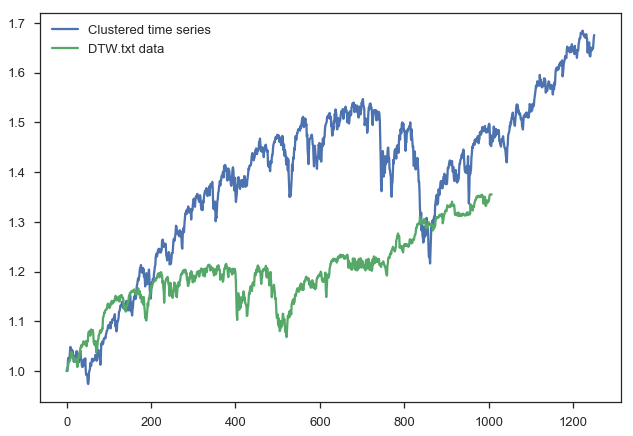

In [57]:
plt.plot(aggregated_ts)
plt.plot(dtw_data)
plt.legend(['Clustered time series', 'DTW.txt data'])

### Problem 3b

Perform a dynamic time warping of the two time series.  Plot the aligned signals.  Provide intution on what the time warping is doing in text and possibly graphics.

In [58]:
from dtw import dtw
dist, cost, acc, path = dtw(aggregated_ts, dtw_data, dist=lambda x, y: (x - y) ** 2)
print('Minimum distance found:', dist)

Minimum distance found: 0.00859012372754


We plot the alignment curve:

(-0.5, 1007.5)

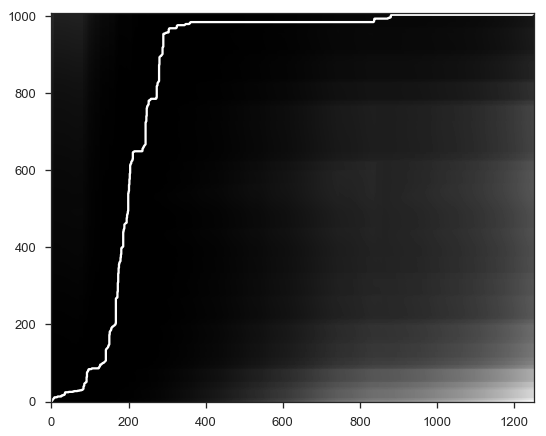

In [59]:
plt.imshow(acc.T, origin='lower', cmap=cm.gray, interpolation='nearest')
plt.plot(path[0], path[1], 'w')
plt.xlim((-0.5, acc.shape[0]-0.5))
plt.ylim((-0.5, acc.shape[1]-0.5))

And the aligned curve:

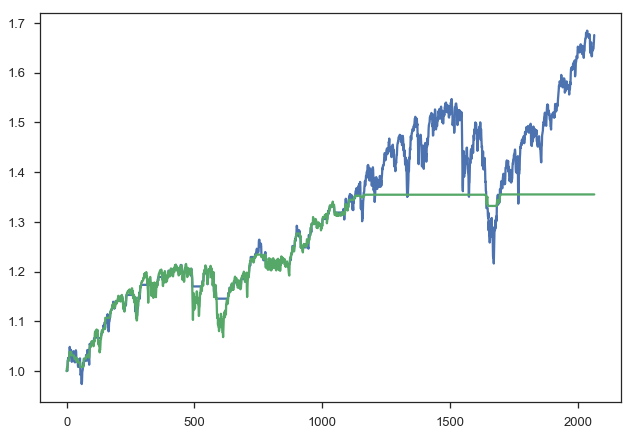

In [60]:
plt.plot(np.array(aggregated_ts[path[0]]))
plt.plot(dtw_data[path[1]])

We see that the DTW algorithm matches the first part of the `dtw.txt` time series very closely to the inital part of the mean return time series. This is actually a bit counterintuitive: if we look at the first plot above, the best matching would roughly "stretch" the green time series by 1.5. This would explain the big dive in the blue time series and the subsequent growth. One does, however, also see that the algorithm matches the initial parts almost perfectly (which is probably the reason for the result).

## Problem 4  Time Series Modeling A (17 points)
Use the data timeSeries1.csv for this problem.

### Problem 4a
Plot the data and perform an exploratory analysis on the raw time series file.  Comment on any trends, outliers, seasonality, whether it's stationary, etc. 


In [61]:
def tsplot(y, lags=None, figsize=(12, 12)):
    
    q, p = sm.stats.diagnostic.acorr_ljungbox(y,lags)
    fig = plt.figure(figsize=figsize)
    layout = (4, 2)
    ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
    acf_ax = plt.subplot2grid(layout, (1, 0))
    pacf_ax = plt.subplot2grid(layout, (1, 1))
    qq_ax = plt.subplot2grid(layout, (2, 0), colspan=2, title='QQ plot')
    lbox_ax = plt.subplot2grid(layout, (3, 0), colspan=2, title='Ljung-Box statistic')
    lbox_ax.set_ylim([0, 1])

    y.plot(ax=ts_ax, title='Residuals')
    smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
    smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)

    qqplot(y,  line='q', ax=qq_ax, fit=True)
    if np.max(p) > 0.05:
        lbox_ax.axhline(y=0.05, xmin=0, xmax=lags, c ='r')
    lbox_ax.plot(p)
    sns.despine()
    plt.tight_layout()
    return ts_ax, acf_ax, pacf_ax, lbox_ax

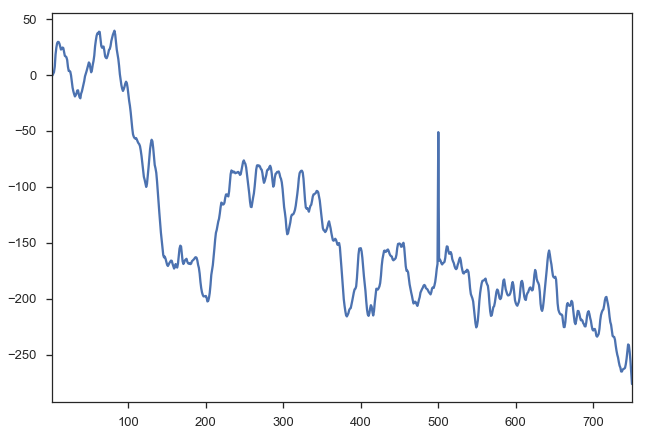

In [62]:
time_series1 = pd.read_csv("timeSeries1.csv", index_col=0)
time_series1 = time_series1['x']

time_series1.plot()

The graph above shows the raw time series data. 

The first thing that we note is that there is a trend: after the timestep 100, we see that the values go down quite dramatically, only to rise again. Next, from time 250 onwards, it looks like there is a linear trend which is overlayed by noise. 

There is a distinctive outlier around time 500. The value of the time series jumps massively from -200 to -50, a variation the can hardly be explained by noise, if we look at the neighboring data. 

Whether there is seasonality or not is not clear from the plot. It looks like there might be, which one can see from the "regular" up-and-down patterns that have a low frequency. This may, however, also only appear to be seasonality.

From the first comment above, it is already clear that the time series is not stationary (the mean towards the end is much lower than the mean at the beginning of the time series). Thus, if we want to have a model of this time series, we definitely will need to remove the trend. If the seasonal pattern turns out to hold, it will also be necessary to remove it, either by differencing or by one of the other approaches. The ACF and PACF will hopefully guide our way.

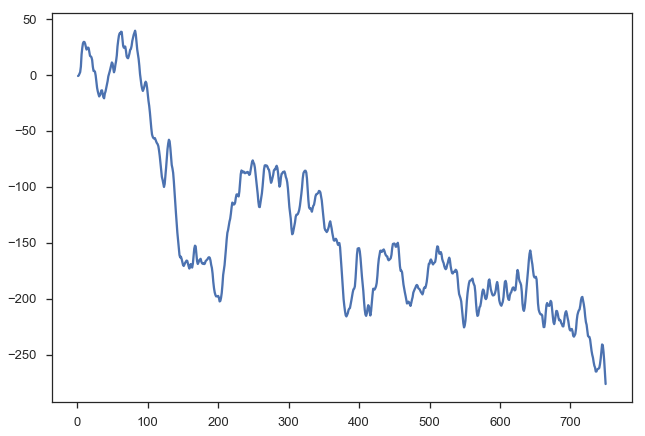

In [63]:
time_series1[500] = time_series1[499]
plt.plot(time_series1)

### Problem 4b
Using your knowledge of ACF, PACF and other diagnostics, walk us through the selection of an appropriate ARIMA model for the data.  We are interested in both the result and your logical journey to reach that model.  The insight-free brute force method of trying every possible model is not what we are looking for here.  Be sure to include the final equation of your model.

We already noted that the time series is definitely not stationary. Let us start with plotting the ACF and PACF:

(<matplotlib.axes._subplots.AxesSubplot at 0x133008da0>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1331bd128>)

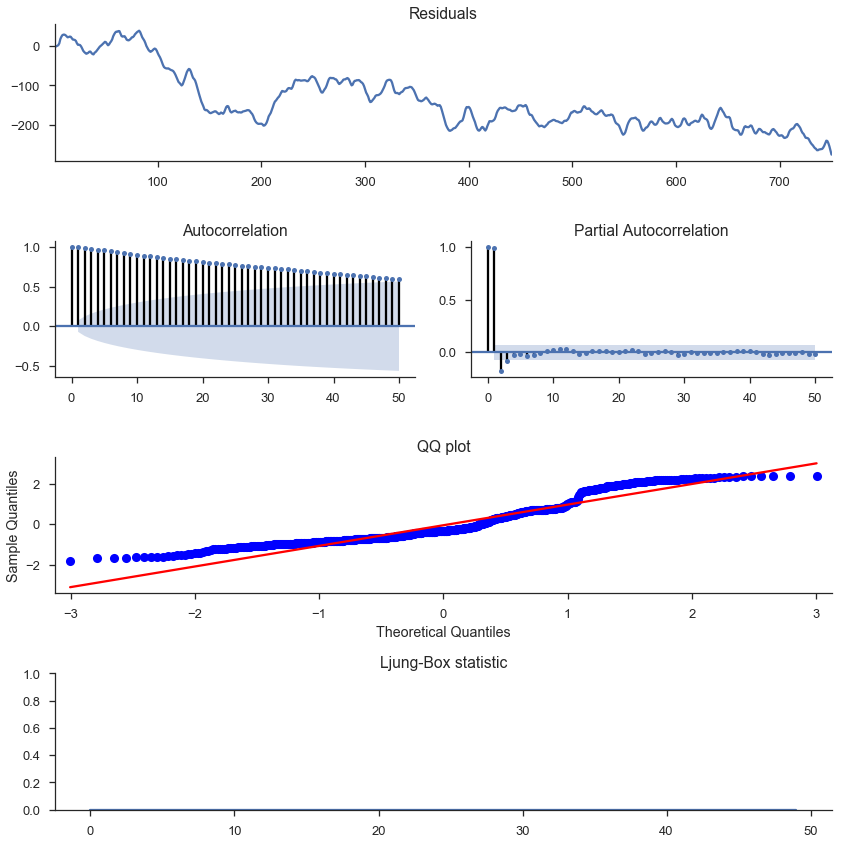

In [64]:
tsplot(time_series1, lags=50)

We see a very slowly decaying ACF, but very fast decaying PACF that goes from positive to negative. From the magic table that we have looked at in lecture, it might be an AR(1): the autocorrelation decays exponentially and the PACF is insignificant after 1 lag. Let us try that:

In [65]:
arima_ts1 = ARIMA(np.array(time_series1), order=(1, 0, 0))
result = arima_ts1.fit()

In [66]:
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                      y   No. Observations:                  750
Model:                     ARMA(1, 0)   Log Likelihood               -2118.805
Method:                       css-mle   S.D. of innovations              4.062
Date:                Sat, 30 Sep 2017   AIC                           4243.610
Time:                        23:40:31   BIC                           4257.470
Sample:                             0   HQIC                          4248.950
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       -139.1178    111.838     -1.244      0.214    -358.317      80.081
ar.L1.y        0.9995      0.001   1384.772      0.000       0.998       1.001
                                    Roots                                    
=============================================================================
                 Real           Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.0005           +0.0000j            1.0005            0.0000
-----------------------------------------------------------------------------
"""

First of all, we see that the the AR1 coefficient is highly significant, but we also see that the coefficient is very close to one. This suggests that the model is actually a random walk. The ACF and PACF plots show that both lag two terms stay significant.

(<matplotlib.axes._subplots.AxesSubplot at 0x134bb3668>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1333c7ef0>)

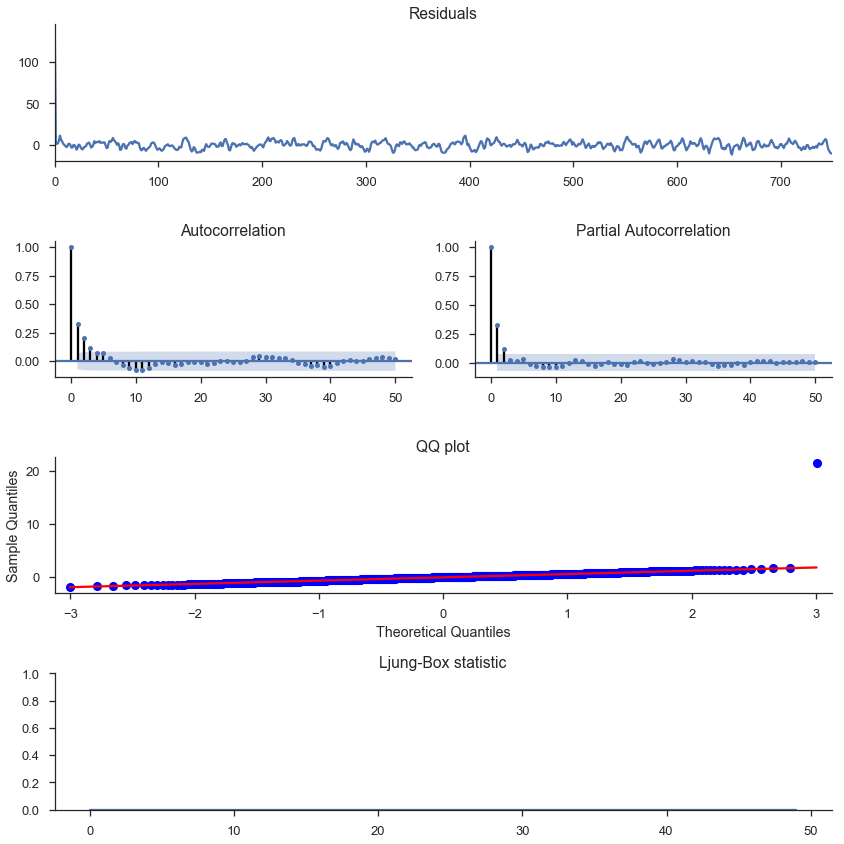

In [67]:
tsplot(pd.Series(result.resid), lags=50)

In [68]:
arima_ts1 = ARIMA(np.array(time_series1), order=(0, 1, 0))
result = arima_ts1.fit()

(<matplotlib.axes._subplots.AxesSubplot at 0x138586780>,
 <matplotlib.axes._subplots.AxesSubplot at 0x138afdc18>)

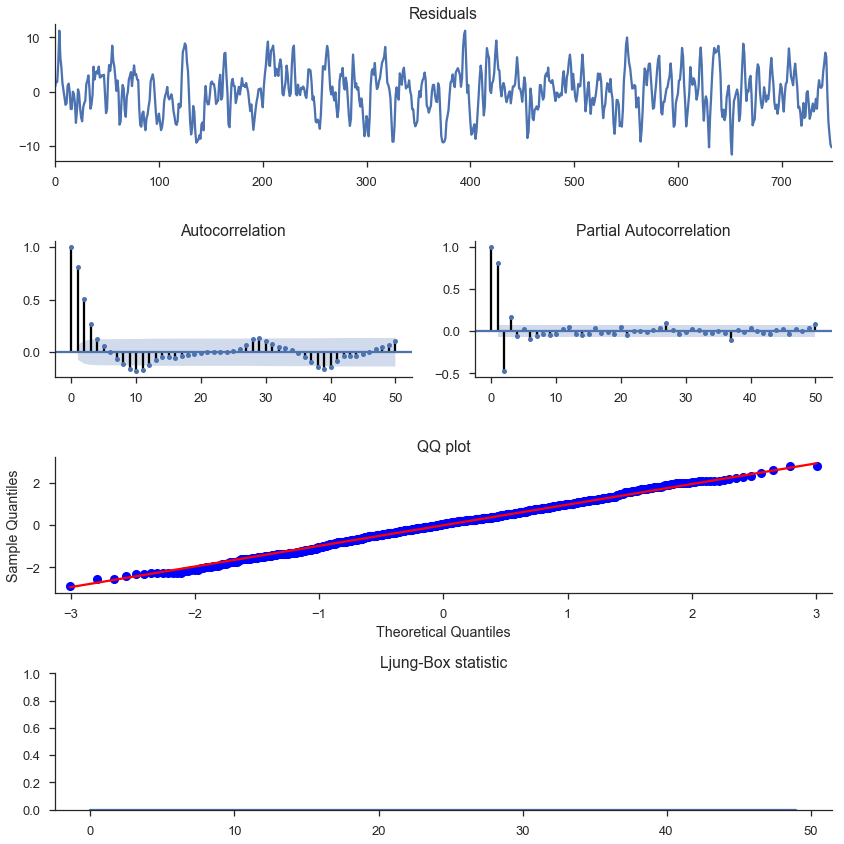

In [69]:
tsplot(pd.Series(result.resid), lags=50)

This model is better suited to remove the trend.

We see a clear a sinusoid pattern in the ACF that goes to zero eventually and the PACF becomes insignificant after lag 3. This suggests fitting the residuals with an AR(3) model. We will try an AR(2) as well.

In [70]:
arima2_ts1 = ARIMA(np.array(time_series1), order=(2, 1, 0))
result = arima2_ts1.fit()

(<matplotlib.axes._subplots.AxesSubplot at 0x138d1bfd0>,
 <matplotlib.axes._subplots.AxesSubplot at 0x138f9e0b8>)

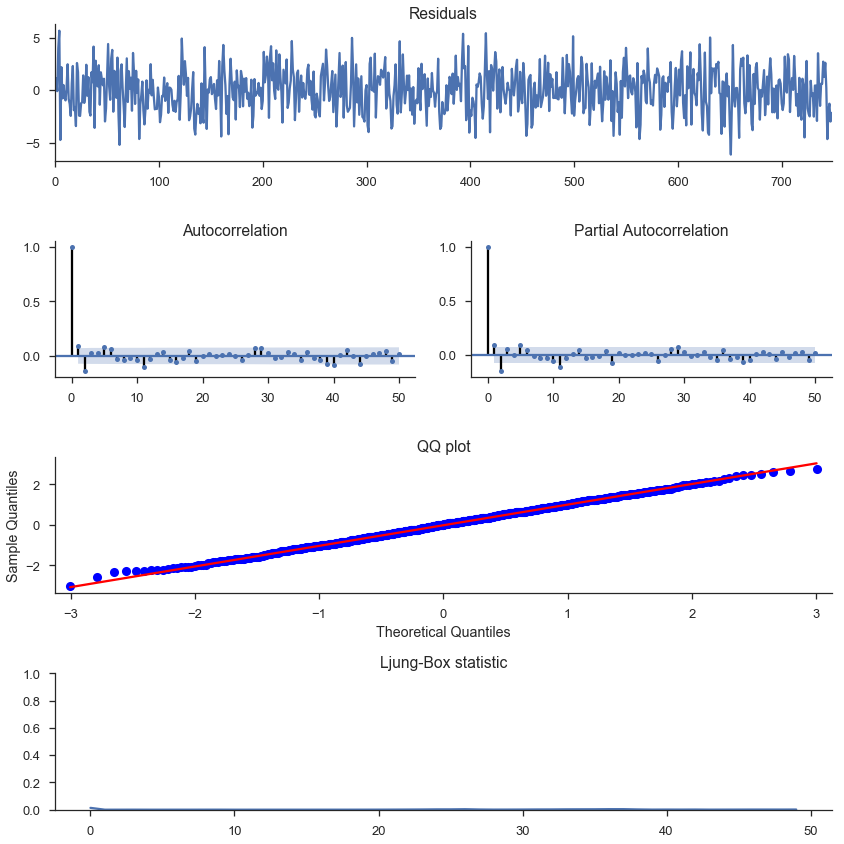

In [71]:
tsplot(pd.Series(result.resid), lags=50)

We still see some bumps in the ACF and PACF, especially at lag 2. Also the Ljung-Box statistic remains significant with very low p-values. Let us now try the Arima $(3, 1, 0)$:

In [72]:
arima3_ts1 = ARIMA(np.array(time_series1), order=(3, 1, 0))
result = arima3_ts1.fit()

(<matplotlib.axes._subplots.AxesSubplot at 0x138fd0828>,
 <matplotlib.axes._subplots.AxesSubplot at 0x13ab42e48>)

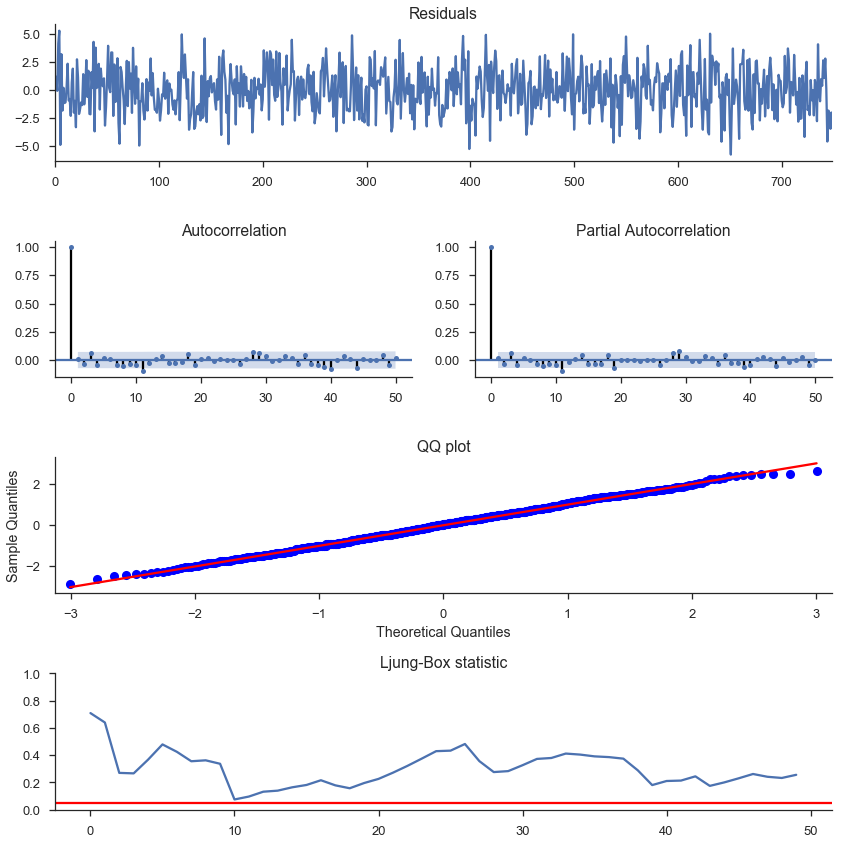

In [73]:
tsplot(pd.Series(result.resid), lags=50)

In [74]:
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                    D.y   No. Observations:                  749
Model:                 ARIMA(3, 1, 0)   Log Likelihood               -1586.534
Method:                       css-mle   S.D. of innovations              2.010
Date:                Sat, 30 Sep 2017   AIC                           3183.068
Time:                        23:40:36   BIC                           3206.162
Sample:                             1   HQIC                          3191.968
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.3941      0.336     -1.174      0.241      -1.052       0.264
ar.L1.D.y      1.2986      0.036     36.175      0.000       1.228       1.369
ar.L2.D.y     -0.7027      0.054    -13.092      0.000      -0.808      -0.598
ar.L3.D.y      0.1858      0.036      5.162      0.000       0.115       0.256
                                    Roots                                    
=============================================================================
                 Real           Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.5134           -0.0000j            1.5134           -0.0000
AR.2            1.1340           -1.5065j            1.8856           -0.1473
AR.3            1.1340           +1.5065j            1.8856            0.1473
-----------------------------------------------------------------------------
"""

Note that all coefficients of the model are highly significant. Let us challenge the model by trying a more complicated one and checking the significance of the terms:

In [75]:
arima3_ts1 = ARIMA(np.array(time_series1), order=(3, 1, 1))
result3 = arima3_ts1.fit()
result3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                    D.y   No. Observations:                  749
Model:                 ARIMA(3, 1, 1)   Log Likelihood               -1584.186
Method:                       css-mle   S.D. of innovations              2.004
Date:                Sat, 30 Sep 2017   AIC                           3180.372
Time:                        23:40:36   BIC                           3208.085
Sample:                             1   HQIC                          3191.051
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.3896      0.315     -1.238      0.216      -1.006       0.227
ar.L1.D.y      0.8480      0.169      5.024      0.000       0.517       1.179
ar.L2.D.y     -0.1534      0.215     -0.713      0.476      -0.575       0.268
ar.L3.D.y     -0.0351      0.099     -0.355      0.723      -0.229       0.158
ma.L1.D.y      0.4664      0.163      2.853      0.004       0.146       0.787
                                    Roots                                    
=============================================================================
                 Real           Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.7605           -0.7165j            1.9007           -0.0615
AR.2            1.7605           +0.7165j            1.9007            0.0615
AR.3           -7.8957           -0.0000j            7.8957           -0.5000
MA.1           -2.1441           +0.0000j            2.1441            0.5000
-----------------------------------------------------------------------------
"""

(<matplotlib.axes._subplots.AxesSubplot at 0x13a85e4a8>,
 <matplotlib.axes._subplots.AxesSubplot at 0x13c618668>)

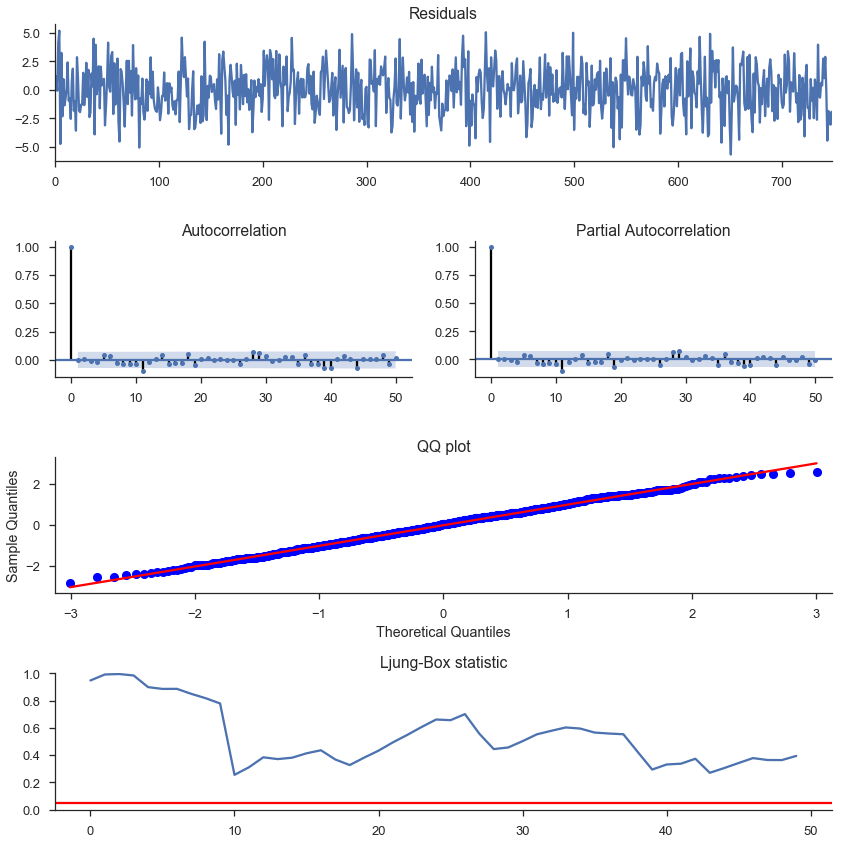

In [76]:
tsplot(pd.Series(result3.resid), lags=50)

From the diagnostics, this model performs a bit better (no significant auto-correlation or pac, the p-values of the Ljung-Box test are a bit higher) and the AIC and BIC are slightly better, but not all coefficients are significant. We decided to go with the ARIMA(3, 1, 0).

The final equation is then

$$\Delta x_t = -0.39 + 1.30 \Delta x_{t - 1} - 0.70 \Delta x_{t - 2} + 0.19 \Delta x_{t - 3} + \epsilon_t $$

### Problem 4c
Apply and show the appropriate diagnostics to the model to assert that it is valid.  Include not just a plot but your interpretation of the plot in your justification.

The plot is shown above. The final model chosen is an ARIMA $(3, 1, 0)$ and the process of obtaining it was shown above as well.

The diagnostics show that model fits the data well enough. The autocorrelation and partial autocorrelations are all insignificant. There are no obvious patterns remaining.

Also, in the residuals there are no obvious patterns remaining. The residuals follow a normal white noise process quite well as can be seen by the qq-plot: the points do not deviate in any significant way from the line.

The plot of the Ljung-Box statistic (which test for statistical significance of autocorrelations) shows that all p-values are insignificant, implying that white noise is a reasonable model.

### Problem 4d
Predict and plot the next 100 data points.

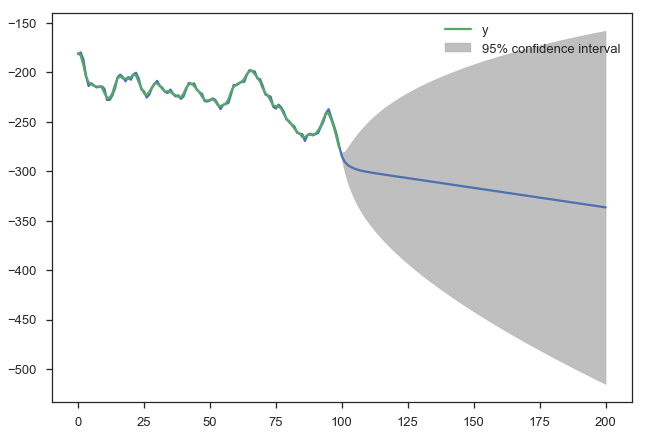

In [77]:
_ = result.plot_predict(start=650, end=850)

We add around 100 points from the original time series to get a bit more insight how well our prediction actually works. We see quite a wide confidence interval, but also that with a reasonably high confidence, we predict that the result in 100 days will not be higher than the result at the end of the time series.

## Problem 5  Time Series Modeling B (18 points)
Use the data timeSeries2.csv for this problem.  The data are monthly reports of production.

### Problem 5a 
Plot the data and perform an exploratory analysis on the raw time series file.  Comment on any trends, outliers, seasonality, whether it's stationary, etc. 

(<matplotlib.axes._subplots.AxesSubplot at 0x13ca51cf8>,
 <matplotlib.axes._subplots.AxesSubplot at 0x13d3aaf28>)

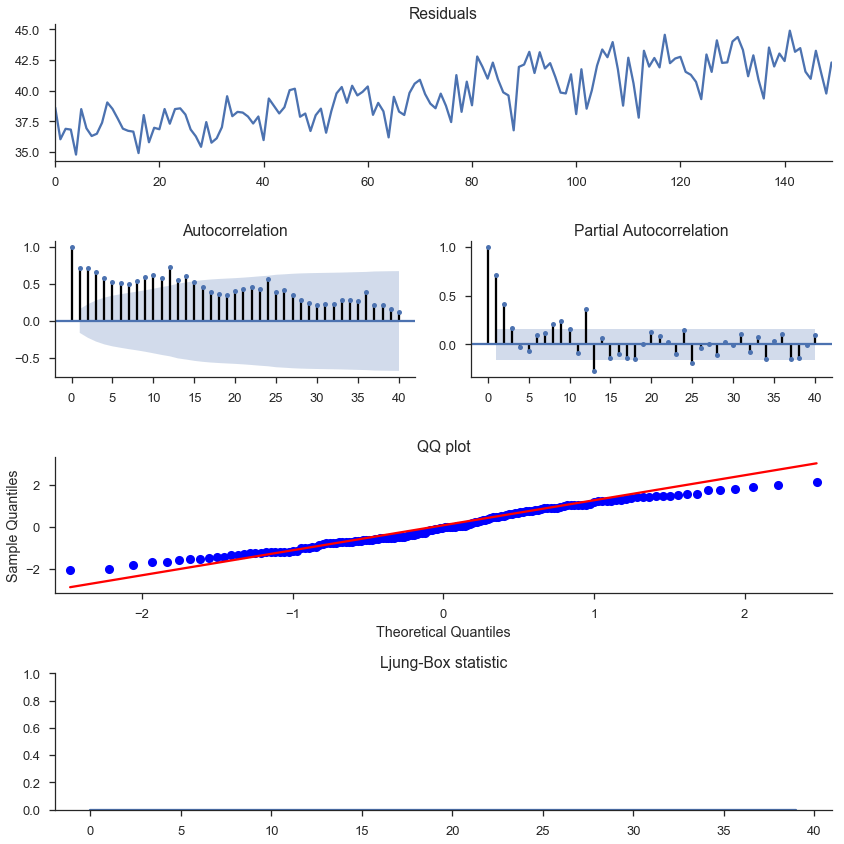

In [78]:
time_series2 = pd.read_csv("timeSeries2.csv", index_col=0)['x']
time_series2 = np.array(time_series2)

tsplot(pd.Series(time_series2), lags=40)

In this time series, we immediately see a couple of features relevant to the modelling:

+ There is a trend: the mean value at the end is much higher than the mean at the beginning. This implies, in particular, already that the time series cannot be stationary.
+ There is some kind of cyclic pattern. The period of this cyclic pattern is not totally obvious from the plot, but it seems to be around 12 (so maybe we are currently looking at monthly data).
+ The variance could be stationary. This is not quite clear from eyeballing this plot. One could also argue that the variance seems to be increasing towards the end of the time series.

### Problem 5b
Using your knowledge of ACF, PACF and other diagnostics, walk us through the selection of an appropriate time series model for the data.  We are interested in both the result and your logical journey to reach that model.  The insight-free brute force method of trying every possible model is not what we are looking for here.  You don't have to include the final equation but do include the ARIMA form of the best model.

(<matplotlib.axes._subplots.AxesSubplot at 0x13e22e1d0>,
 <matplotlib.axes._subplots.AxesSubplot at 0x13fe1aa90>)

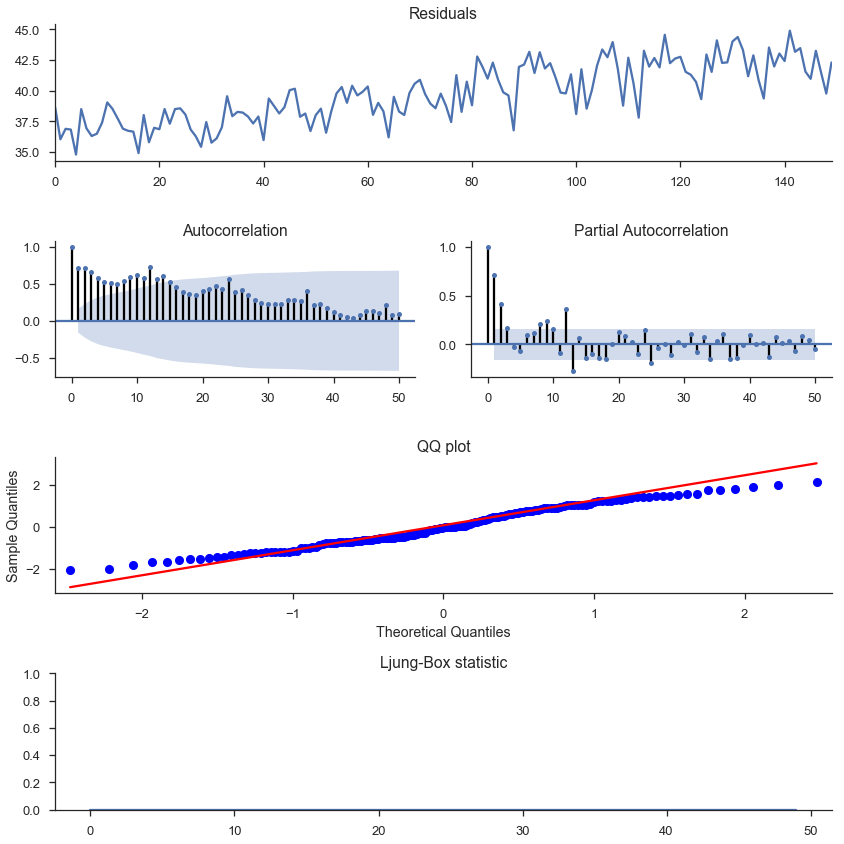

In [79]:
tsplot(pd.Series(time_series2), lags=50)

We see that we have a slowly decaying ACF that goes up again at a lag of 12. Also, the PACF is insignificant after a lag of 2 only to increase again. Let us try to fit the non-seasonal pattern using a random walk:

(<matplotlib.axes._subplots.AxesSubplot at 0x13d37c8d0>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1418af2b0>)

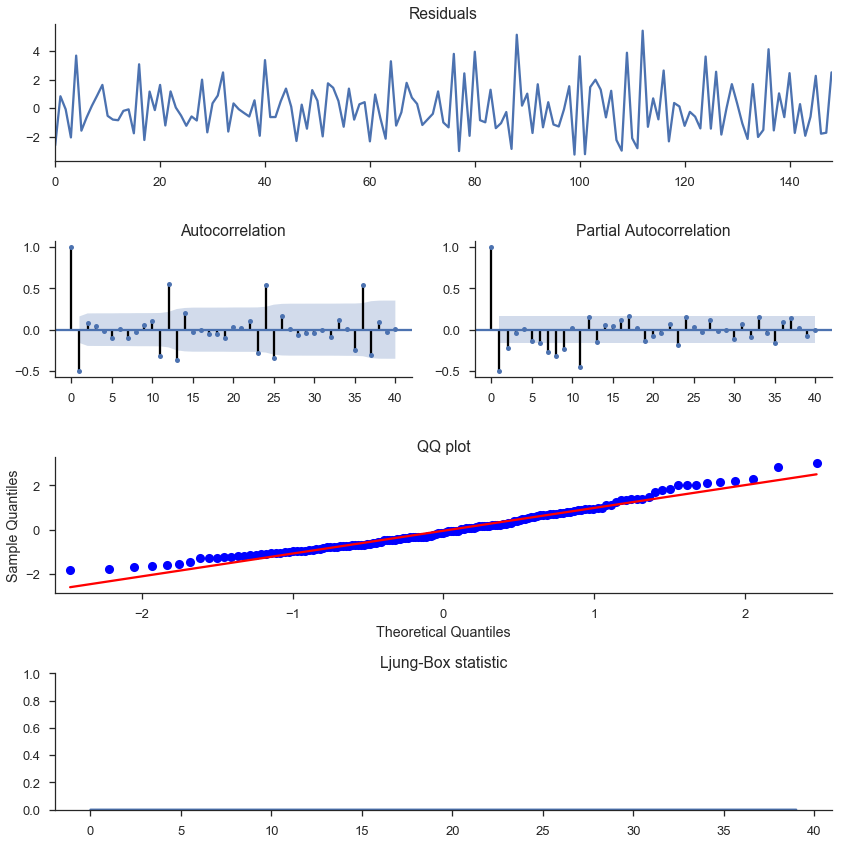

In [80]:
model = ARIMA(time_series2, order=(0, 1, 0))
result = model.fit()
tsplot(pd.Series(result.resid), lags=40)

This already fits the non-seasonal pattern to a good degree. Let us try to fit seasonal pattern. By looking at the decay pattern of the ACF and PACF at lags 12, 24 and 36, an AR(1) model might be a good fit to the seasonal pattern:

(<matplotlib.axes._subplots.AxesSubplot at 0x141875b00>,
 <matplotlib.axes._subplots.AxesSubplot at 0x14235cda0>)

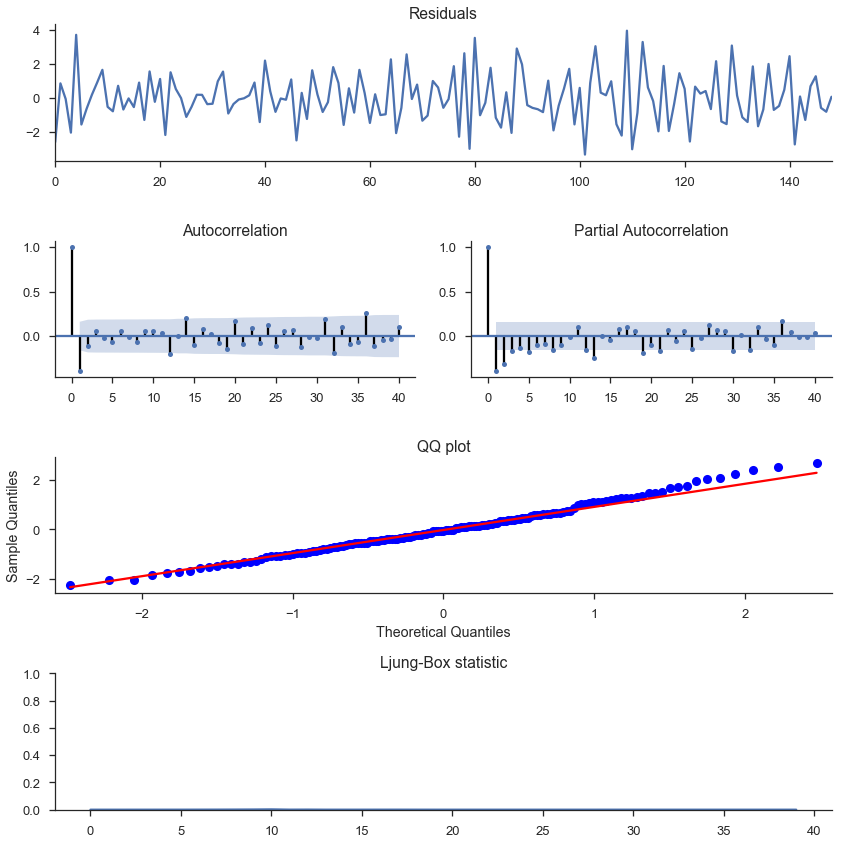

In [81]:
model = SARIMAX(time_series2, 
               order=(0, 1, 0), 
               seasonal_order=(1, 0, 0, 12),
               simple_differencing=True)
result = model.fit()
tsplot(pd.Series(result.resid), lags=40)

Now, for the non-seasonal part, it seems plausible to add an MA(2) component, since the PACF decays and the ACF is 0 after lag 2 (actually already at lag 2, but anyway...)

(<matplotlib.axes._subplots.AxesSubplot at 0x1423ff0f0>,
 <matplotlib.axes._subplots.AxesSubplot at 0x124dee048>)

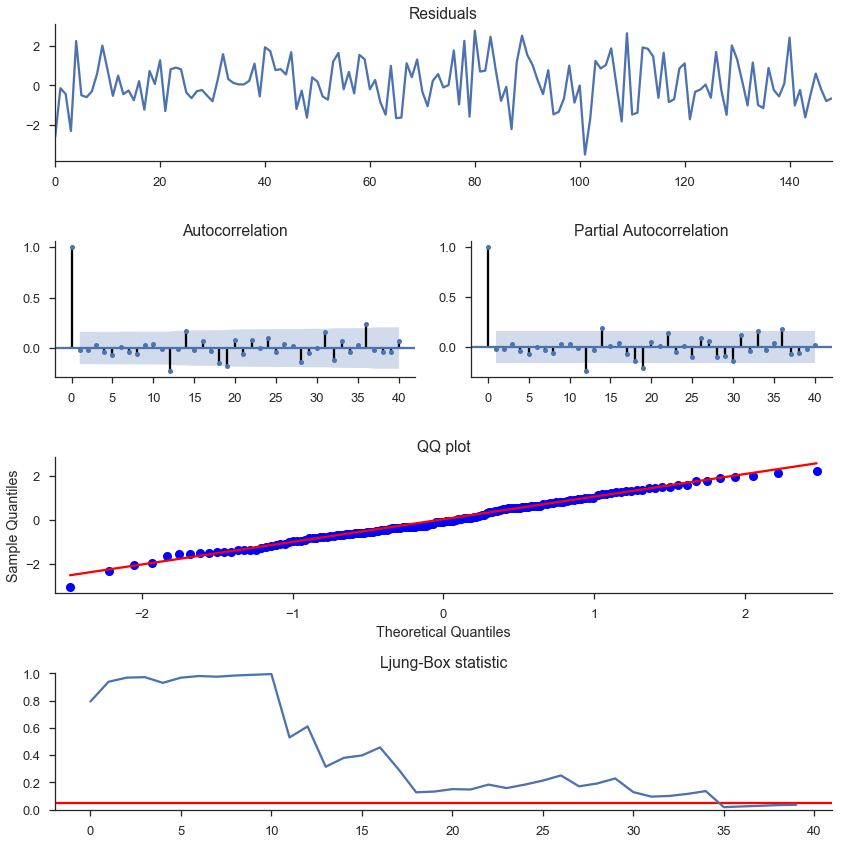

In [82]:
model = SARIMAX(time_series2, 
               order=(0, 1, 2), 
               seasonal_order=(1, 0, 0, 12),
               simple_differencing=True)
result = model.fit()
tsplot(pd.Series(result.resid), lags=40)

Now, that looks quite good. We just need to get rid of the remaining seasonal terms. We add an MA term to the seasonal order.

(<matplotlib.axes._subplots.AxesSubplot at 0x1418f2e48>,
 <matplotlib.axes._subplots.AxesSubplot at 0x142dae208>)

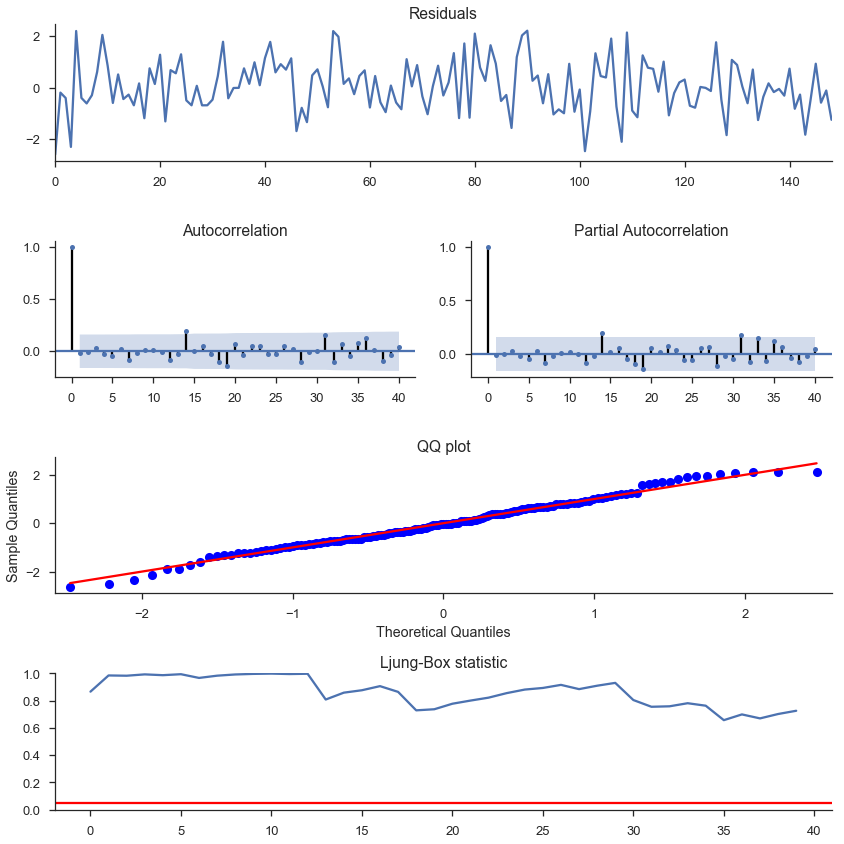

In [83]:
model = SARIMAX(time_series2, 
               order=(0, 1, 2), 
               seasonal_order=(1, 0, 1, 12),
               simple_differencing=True)
result = model.fit()
tsplot(pd.Series(result.resid), lags=40)

In [84]:
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                                D.y   No. Observations:                  149
Model:             SARIMAX(0, 0, 2)x(1, 0, 1, 12)   Log Likelihood                -213.118
Date:                            Sat, 30 Sep 2017   AIC                            436.237
Time:                                    23:40:44   BIC                            451.257
Sample:                                         0   HQIC                           442.339
                                            - 149                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7396      0.073    -10.185      0.000      -0.882      -0.597
ma.L2         -0.1442      0.079     -1.822      0.068      -0.299       0.011
ar.S.L12       0.9922      0.014     70.348      0.000       0.965       1.020
ma.S.L12      -0.8421      0.124     -6.790      0.000      -1.085      -0.599
sigma2         0.8792      0.121      7.270      0.000       0.642       1.116
===================================================================================
Ljung-Box (Q):                       40.79   Jarque-Bera (JB):                 0.76
Prob(Q):                              0.44   Prob(JB):                         0.68
Heteroskedasticity (H):               1.57   Skew:                             0.11
Prob(H) (two-sided):                  0.11   Kurtosis:                         2.73
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Problem 5c
Apply and show the appropriate diagnostics to the model to assert that it is valid.  Include not just a plot but your interpretation of the plot in your justification.

The diagnostics are plotted above. Let us comment them here:

+ There is no obvious pattern left in the residuals.
+ The QQ plot looks quite good, although in the tails we might be off a bit. There is, however, nothing terribly wrong.
+ The Ljung-Box statistic plot is everywhere non-significant. Thus, we cannot reject the hypothesis that the residual ACF is zero for all lags.
+ The ACF and PACF functions are mostly non-significant. There is one "high" ACF and "PACF" at lag 14. Some of the bars are expected to be "significant" just by chance. The fact that they occur at the same location is a bit suspicious, but they don't appear at later lags like 28, 42 anymore.

The final model is an $SARIMA(0, 1, 2)(1, 0, 1)_{12}$.

### Problem 5d
Predict and plot the next 20 data points.

In [85]:
len(time_series2)

150

(<matplotlib.axes._subplots.AxesSubplot at 0x133860e80>,
 <matplotlib.axes._subplots.AxesSubplot at 0x138e70978>)

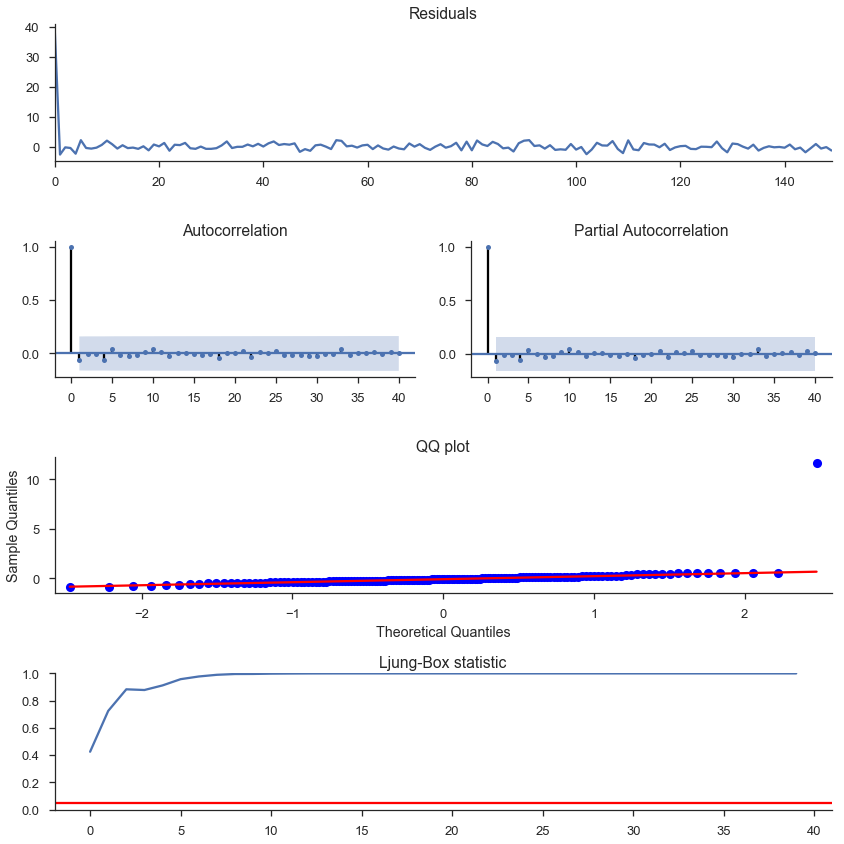

In [86]:
model = SARIMAX(time_series2, 
               order=(0, 1, 2), 
               seasonal_order=(1, 0, 1, 12),
               simple_differencing=False)
result = model.fit()
tsplot(pd.Series(result.resid), lags=40)

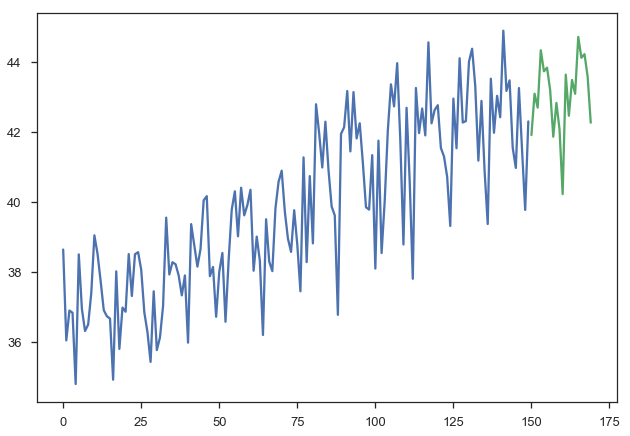

In [ ]:
new_times = list(range(len(time_series2), len(time_series2) + 20))
plt.plot(range(0, len(time_series2)), time_series2)
plt.plot(new_times, result.predict(start=len(time_series2), end=len(time_series2) + 19))

In order to faciliate the predictions, we set `simple_differencing=False`, so that the model does not only predict the residuals. The diagnostics are plotted as well and they look good (with the exception of one point in the qq-residual plot). Thus it makes sense to use this model to predict. 

The full time series is shown in blue, the predict points in green. They seem to follow the correct seasonal pattern and trend.

## Optional Exploratory Points

Find an interesting time series data set that we cannot find in a time series textbook, lecture, etc. and model it.  Be sure to cite its source.

Explore ways of showing that your clustering scheme in Problem 1 or 2 is correct, interesting, etc.